This notebook is used to test and debug utility functions before integrating them into ```utils.py```.
Functions are migrated from exploratory notebooks (e.g. ```differential_analyse_Borealis.ipynb```) and refined here.

In [1]:
# Imports required for battery data processing and differential analysis
from pathlib import Path
import re
import os
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from scipy.signal import find_peaks, peak_widths
from scipy import interpolate
from collections import defaultdict

In [2]:
# Link key variables to column names, both from the original dataset and for new columns generated during processing.

# Dataset_given
T = 'Test_Time(s)'
I = 'Current(A)'
V = 'Voltage(V)'
Qc = 'Charge_Capacity(Ah)'
Qd = 'Discharge_Capacity(Ah)'
Ec = 'Charge_Energy(Wh)'
Ed = 'Discharge_Energy(Wh)'
P = 'Power(W)'
dqdv_raw = 'dQ/dV(Ah/V)'
dvdq_raw = 'dV/dQ(V/Ah)'

# --- Route 1: Downsampling ---
# Down-sampled data
ds_v = "Downsampled Voltage (V)"
ds_q = "Downsampled Capacity (Ah)"
ds_p = "Downsampled Power (W)"
ds_e = "Downsampled Energy (Wh)"

# Derivatives from downsampled data
ds_dqdv = "dQ/dV from downsampled Voltage (Ah/V)"
ds_dvdq = "dV/dQ from downsampled Cpacity (V/Ah)"
ds_dpde = "dP/dE from downsampled Energy (W/Wh)"

# --- Route 2: Interpolation ---
# Uniform grid
uniq = "Uniform_Q_grid (Ah)"
univ = "Uniform_V_grid (V)"
unie = "Uniform_E_grid (Wh)"

# Interpolated
v_uniq = 'V_from_uniform_Q (V)'
q_univ = 'Q_from_uniform_V (Ah)'
p_unie = 'P_from_uniform_E (W)'

dvdq_univ = 'dV_dQ_interp_vs_V (V/Ah)' # dV/dQ interpolated on uniform voltage grid
dqdv_univ = 'dQ_dV_interp_vs_V (Ah/V)'
dpde_univ = 'dP_dE_interp_vs_V (W/Wh)'

# Increments (x-axis increment of interpolation)
dq = "Delta_Q (Ah)"
dv = "Delta_V (V)"
de = "Delta_E (Wh)"
dt = "Delta_t (h)"

# Computed derivatives
dvdq = 'dV_dQ_interp_smooth (V/Ah)' # gradient calculated from interpolated + smoothed V(Q)
dvdq_it = 'dV_dQ_from_I (V/Ah)' # capacity calculated from integration of current
dqdv = 'dQ_dV_interp_smooth (Ah/V)'
dpde = 'dP_dE_interp_smooth (W/Wh)'

# Smoothed
sm_v_uniq = 'Smoothed_V_from_Q (V)'
sm_q_univ = 'Smoothed_Q_from_V (Ah)'
sm_p_unie = 'Smoothed_P_from_E (W)'

# --- LEAN ---
lean_dqdv = "dQ/dV from LEAN (Ah/V)"
lean_dv = "Delta_V (V) in LEAN"

In [3]:
# Unify plot descriptions
def _make_title(kind, folder_no, cycle_no, process):
    return f"{kind} from Folder {folder_no}, Cycle {cycle_no} [{process}]"

def _make_label(kind):
    labels = {
        'q': "Capacity (Ah)",
        'v': "Voltage (V)",
        't': "Time (h)",
        
        'title_implementation_validation': "Validation of $dQ/dV$ Implementation Using Raw and Reconstructed Inputs",
        'deri_pipeline_axis': "$dQ/dV$ (Ah/V)",
        'deri_raw': '$dQ/dV$ (Dataset-provided)',
        'deri_it': '$dQ/dV$ (Computed from reconstructed $Q = \int I(t),dt$)',
        'deri_sm': '$dQ/dV$ (Computed from interpolated + smoothed $Q(V)$)',
        
        'title_smoothing_impact': "Effect of Smoothing on $dQ/dV$ Signal Clarity",
        'deri_no_sm': "$dQ/dV$ (Unsmooth input)",
        'deri_with_sm': "$dQ/dV$ (With Savitzky–Golay smoothing)",
        'deri_sm_axis': "$dQ/dV$ (Ah/V)",
        
        'title_comparison': "Normalised Comparison of Differential Diagnostic Techniques",
        'comparison_yaxis': "Signal (a.u.)",
        'dvdq': "$dV/dQ$ (normalised)",
        'dqdv': "$dQ/dV$ (normalised)",
        'dpde': "$dP/dE$ (normalised)",
        'dcs': "DCS (normalised histogram of $\Delta Q$ vs $V$)",
        
        'title_bin_impact': "DCS Plot – Bin Width & Interpolation Sensitivity",
        'dcs_y_label': "Counts (∝ Capacity)",
        
        'title_evolution': "Evolution of $dP/dE$ Peak Features with Cycling",
        
        'title_vq': "Voltage–Capacity Curve"
    }
    return labels.get(kind, kind)

In [4]:
def get_paths():
    """
    Returns a dictionary of commonly used output paths for plots and data.
    Automatically creates all directories if they do not exist.
    """
    current_dir = Path.cwd()

    paths = {
        "processed_cache": current_dir.parent / 'Data' / 'processed_cache',
        
        "processed_data": current_dir.parent / 'Data' / 'processed_data',
        # processed, with derivatives etc
        
        "output_plot_path": current_dir.parent / 'Plots',
        
        "output_mono_data_path": current_dir.parent / 'Data' / 'monotonic_segments' # monotonic segments
    }

    for path in paths.values():
        path.mkdir(parents=True, exist_ok=True)

    return paths

In [5]:
def build_cycle_file_map():
    """
    Build a mapping from folder number to .xlsx file path. Targeted at the Borealis dataset specifically.

    Returns:
        dict[int, Path]: Mapping of folder number to corresponding Excel file path.
    """
    current_dir = Path.cwd()
    raw_path = current_dir.parent / 'Data' / 'raw_data' / '03-CONSTANT CURRENT protocol_Cycles 0 to 1000'
    cycle_file_map = {}
    for folder_path in sorted(raw_path.glob("Cycle *"), key=lambda p: int(p.name.split()[-1])):
        if folder_path.is_dir():
            folder_no = int(folder_path.name.replace("Cycle ", ""))
            xlsx_files = list(folder_path.glob("*.xlsx"))
            if not xlsx_files:
                print(f"[Warning] No .xlsx file found in {folder_path}")
                continue
            cycle_file_map[folder_no] = xlsx_files[0]
    return cycle_file_map

def read(folder_no):
    
    """
    Read Excel file corresponding to a given folder number.

    Parameters:
        folder_no (int): Folder number
        
    Returns:
        pd.DataFrame: Loaded Excel file as DataFrame
    """
    cycle_file_map = build_cycle_file_map()
    
    if folder_no not in cycle_file_map:
        raise ValueError(f"Folder {folder_no} not found in map.")
    return pd.read_excel(cycle_file_map[folder_no])

## Cleaning and Segmenting

In [6]:
def separate_charge_discharge(cycle_df):
    '''
    Splits a single cycle's data into charge and discharge segments,
    and selects only relevant columns for further analysis.

    For each segment, rows with missing or non-positive capacity values are removed.

    Parameters:
    - cycle_df (pd.DataFrame): DataFrame containing one cycle of raw data,
      including columns for current, voltage, capacity, energy, etc.

    Returns:
    - charge_df (pd.DataFrame): Cleaned charge segment where current > 0 and Qc > 0.
    - discharge_df (pd.DataFrame): Cleaned discharge segment where current < 0 and Qd > 0.

    Notes:
    - The following columns are selected for charge:
        [I, T, V, Qc, dvdq_raw, dqdv_raw, Ec, P]
      and for discharge:
        [I, T, V, Qd, dvdq_raw, dqdv_raw, Ed, P]
    - Rows with NaNs in any critical column are dropped.
    '''
    charge_df = cycle_df[cycle_df[I] > 0].copy()
    charge_df = charge_df[[I, T, V, Qc, dvdq_raw, dqdv_raw, Ec, P]].dropna(subset=[I, T, V, Qc, Ec, P]).reset_index(drop=True)
    charge_df = charge_df[charge_df[Qc] > 0].reset_index(drop=True)

    discharge_df = cycle_df[cycle_df[I] < 0].copy()
    discharge_df = discharge_df[[I, T, V, Qd, dvdq_raw, dqdv_raw, Ed, P]].dropna(subset=[I, T, V, Qd, Ed, P]).reset_index(drop=True)
    discharge_df = discharge_df[discharge_df[Qd] > 0].reset_index(drop=True)

    return charge_df, discharge_df

In [7]:
def separate_valid_cycles(df, folder_no, min_seg_length, min_v_variation):
    '''
    Filters valid charge/discharge cycles based on basic quality criteria.

    For each cycle in the dataset:
    - Splits into charge and discharge segments.
    - Checks that both segments are non-empty.
    - Ensures each segment has at least `min_seg_length` data points.
    - Ensures each segment contains at least `min_v_variation` unique voltage values.

    Parameters:
    - df (pd.DataFrame): Full cycling data, must include 'Cycle_Index'.
    - folder_no (int): Identifier for the source folder (used for tracking).
    - min_seg_length (int): Minimum number of data points required per segment.
    - min_v_variation (int): Minimum number of unique voltages per segment.

    Returns:
    - pd.DataFrame: A dataframe of valid cycles, each with:
        - 'folder_no': source folder ID
        - 'cycle_no': the cycle index
        - 'charge_df': cleaned charge segment
        - 'discharge_df': cleaned discharge segment
    '''
    valid_data = []
    for cycle_no, cycle_df in df.groupby("Cycle_Index"):
        charge_df, discharge_df = separate_charge_discharge(cycle_df)
        if (
            charge_df.empty or discharge_df.empty or
            len(charge_df) < min_seg_length or len(discharge_df) < min_seg_length or
            charge_df[V].nunique() < min_v_variation or discharge_df[V].nunique() < min_v_variation
        ):
            continue
        valid_data.append({
            "folder_no": folder_no,
            "cycle_no": cycle_no,
            "charge_df": charge_df,
            "discharge_df": discharge_df
        })
    return pd.DataFrame(valid_data)

In [8]:
def select_valid_cycle(folder_nos, min_seg_length, min_v_variation):
    '''
    Processes multiple folders to extract valid charge/discharge cycles,
    applying quality filters and caching results to avoid redundant computation.

    For each folder:
    - Loads the corresponding Excel file (from map built by `build_cycle_file_map()`).
    - If cached `.pkl` file exists, loads it and skips processing.
    - Otherwise, reads raw data, identifies valid cycles, prints them, and caches the result.

    Parameters:
    - folder_nos (list of int): List of folder numbers to process.
    - min_seg_length (int): Minimum data points required per charge/discharge segment.
    - min_v_variation (int): Minimum number of unique voltage values per segment.

    Returns:
    - result (dict): Mapping from folder number to a DataFrame of valid cycles.
        Each value is the output of `separate_valid_cycles(...)`.

    Notes:
    - Uses `_folder_cache` to store full dataframes in memory (shared across functions).
    - Cached results are saved to disk as `.pkl` in `paths["processed_cache"]`.
    '''
    result = {}
    
    # Load file map (mapping from folder_no to .xlsx path)

    paths = get_paths()
    save_dir = paths["processed_cache"]

    for folder_no in folder_nos:
        save_path = os.path.join(save_dir, f"folder_{folder_no:04d}.pkl")

        # avoid reloading
        if os.path.exists(save_path):
            print(f"[>>] Skipping folder {folder_no}, already cached.")
            with open(save_path, "rb") as f:
                cache = pickle.load(f)
            _folder_cache[folder_no] = {"df": cache["df"], "folder_no": folder_no}
            result[folder_no] = cache["valid_df"]
            continue

        try:
            if folder_no in _folder_cache:
                df = _folder_cache[folder_no]["df"]
            else:
                df = read(folder_no)
                _folder_cache[folder_no] = {"df": df, "folder_no": folder_no}

            valid_df = separate_valid_cycles(df, folder_no, min_seg_length, min_v_variation)

            print(f"[✓] Valid cycles in folder {folder_no}:")
            for c in valid_df['cycle_no'].unique():
                print(f"  - Cycle {c}")

            with open(save_path, "wb") as f:
                pickle.dump({"df": df, "valid_df": valid_df}, f)

            result[folder_no] = valid_df

        except Exception as e:
            print(f"Error processing folder {folder_no}: {e}")

    return result


# Create the dic for later use: to avoid reloading and enable folder_no -> df
_folder_cache = {}

In [9]:
def get_cycle(folder_cycle_pairs, process, min_seg_length, min_v_variation):
    """
    Given a list of (folder_no, cycle_no) pairs and a process type ('charge' or 'discharge'),
    return a list of corresponding valid segment DataFrames.

    This version uses `select_valid_cycle()` to handle caching and reuse of already-processed data.

    Returns:
        List of (folder_no, cycle_no, segment_df)
    """
    results = []

    # Extract all unique folder numbers from the input pairs
    folder_nos = sorted(set(folder_no for folder_no, _ in folder_cycle_pairs))

    # Use caching + disk storage to identify valid cycles
    valid_cycle_dict = select_valid_cycle(folder_nos, min_seg_length, min_v_variation)

    for folder_no, cycle_no in folder_cycle_pairs:
        if folder_no not in valid_cycle_dict:
            print(f"[!] Folder {folder_no} has no valid cycles.")
            continue

        valid_cycles = valid_cycle_dict[folder_no]
        match = valid_cycles[valid_cycles['cycle_no'] == cycle_no]

        if match.empty:
            print(f"[!] Cycle {cycle_no} not found in folder {folder_no}")
            continue

        row = match.iloc[0]
        segment_df = row["charge_df"] if process == 'charge' else row["discharge_df"]
        results.append((folder_no, cycle_no, segment_df))

    return results

## Making sure the segments are strictly monotonic

In [10]:
def select_vq(folder_cycle_pairs, process, min_seg_length, min_v_variation):
    """
    For each (folder_no, cycle_no), return list of (V, Q) pairs.
    """
    cycles = get_cycle(folder_cycle_pairs, process, min_seg_length, min_v_variation)
    results = []

    q_col = Qc if process == 'charge' else Qd

    for folder_no, cycle_no, segment_df in cycles:
        q = segment_df[q_col]
        v = segment_df[V]
        results.append((v, q))

    return results

In [11]:
def plot_selected_qv(folder_cycle_pairs, process,
                     min_seg_length, min_v_variation,
                     **kwargs):
    """
    Plot raw V–Q curves for multiple (folder_no, cycle_no) pairs, used as a check for the monotonic Q ranges returned by 'monotonic_q_range_process'.
    """
    vq_list = select_vq(folder_cycle_pairs, process,
                        min_seg_length, min_v_variation)

    for i, (folder_cycle, (v, q)) in enumerate(zip(folder_cycle_pairs, vq_list)):
        folder_no, cycle_no = folder_cycle
        title = _make_title(_make_label('title_vq'), folder_no, cycle_no, process)

        plt.figure()  # One plot per curve
        plt.plot(q, v, **kwargs)
        plt.xlabel(_make_label("q"))
        plt.ylabel(_make_label("v"))
        plt.title(title)
        plt.grid(True)
        plt.show()

In [12]:
def monotonic_q_range_single(Q, V, process, tol=0.0, min_points=3):
    """
    process: 'charge' -> slope > tol
             'discharge' -> slope < -tol
    Return: (q_min, q_max) of the longest monotonic region or None
    """
    Q = np.asarray(Q)
    V = np.asarray(V)

    slope = np.diff(V) / np.diff(Q)

    if process == 'charge':
        cond = slope > tol
    elif process == 'discharge':
        cond = slope < -tol
    else:
        raise ValueError("process must be 'charge' or 'discharge'")

    best_len = 0
    best_s = None # s = 'start'
    best_e = None
    run_s = 0

    for i, ok in enumerate(cond):
        if not ok: # so run breaks at i
            run_len = i - run_s + 1 # cond has n-1 elements, so the current segment length = n-1+1
            if run_len > best_len:
                best_len = run_len
                best_s, best_e = run_s, i
            run_s = i + 1 # now start with i+1 to continue to check

    # tail
    run_len = len(cond) - run_s + 1
    if run_len > best_len:
        best_len = run_len
        best_s, best_e = run_s, len(cond)

    if best_len >= min_points:
        return float(Q[best_s]), float(Q[best_e])
    else:
        return None

def monotonic_q_range_process(folder_cycle_pairs, process,
                              min_seg_length=50, min_v_variation=10,
                              tol=0.0, min_points=3):
    vq_list = select_vq(folder_cycle_pairs, process, min_seg_length, min_v_variation)
    out = []
    for V, Q in vq_list:
        res = monotonic_q_range_single(Q, V, process, tol=tol, min_points=min_points)
        print(res)
        out.append(res)
    return out


In [13]:
def save_from_qrange(
    inputs,               # [(folder_no, cycle_no, q_min, q_max), ...]
    process,              # 'charge' or 'discharge'
    min_seg_length,
    min_v_variation
):
    paths = get_paths()
    mono_path = paths["output_mono_data_path"]
    mono_path.mkdir(parents=True, exist_ok=True)

    q_col = Qc if process == 'charge' else Qd
    

    folder_cycle_pairs = [(f, c) for (f, c, _, _) in inputs]
    results = get_cycle(folder_cycle_pairs, process, min_seg_length, min_v_variation)

    q_ranges = defaultdict(list)
    for f, c, q_min, q_max in inputs:
        q_ranges[(f, c)].append((q_min, q_max))


    for folder_no, cycle_no, segment_df in results:
        key = (int(folder_no), int(cycle_no))
        if key not in q_ranges:
            continue

        for q_min, q_max in q_ranges[key]:
            region = segment_df[(segment_df[q_col] >= q_min) & (segment_df[q_col] <= q_max)].copy()
            if region.empty:
                print(f"Empty region for folder {folder_no}, cycle {cycle_no} Q[{q_min}, {q_max}]")
                continue

            file_base = f"Cycle {folder_no}_{process}.csv"
            region.to_csv(mono_path / file_base, index=False)
            # Only folder_no is used in legend because in each folder, the most complete and clean cycle is typically cycle 1. Therefore, the folder number alone serves as a reliable identifier.
            
            print(f"[✓] Saved: {file_base}")

## Enabling quick access to saved monotonic segments
- ```extract_index(file_path)```
Example: ```extract_index(Path(...))``` - Output: "Cycle 72"  
Extract the cycle index (e.g., 'Cycle 72') from a file name.
- ```select_process(process)```  
Example: ```pairs = select_process("charge")```  
Load all CSV files for a given process ('charge' or 'discharge').  
Returns a list of (DataFrame, legend) tuples.
- ```get_df(process, target_legend)```  
Example: ```df = get_df("charge", "Cycle 100")```  
Get a single DataFrame for the specified process and cycle legend.  
- ```get_df_many(process, legends)```  
Yield (legend, DataFrame) pairs for multiple target legends.  
Skips legends not found.



In [14]:
def extract_index(file_path):
    match = re.search(r"Cycle (\d+)", file_path.name)
    return f"Cycle {int(match.group(1))}" if match else None

def select_process(process):
    paths = get_paths()
    output_path = paths["output_mono_data_path"]
    all_files = list(output_path.glob(f"*_{process}.csv"))

    results = []
    for file in all_files:
        legend = extract_index(file)
        if legend:
            df = pd.read_csv(file)
            results.append((df, legend))
    return results

def get_df(process, target_legend):
    for df, lg in select_process(process):
        if lg == target_legend:
            return df
    raise KeyError(f"{target_legend} not found. Available: {[lg for _, lg in select_process(process)]}")

def get_df_many(process, legends):
    for lg in legends:
        try:
            yield lg, get_df(process, lg)
        except KeyError:
            print(f"[skip] {lg} not found")

## Resampling
Can be done via two routes, depending on the density of raw data.  
If original sampling frequency is:  
- **Too low**: Interpolation
- **Sufficiently High**: Downsampling/filtering
Some relatively old literature also uses interpolation when there are enough data points.

### Downsampling
The route taken in this project.

In [15]:
def typical_step(x, decimals=5):
    x = np.asarray(x, float)
    d = np.diff(x)
    d = d[np.isfinite(d) & (d != 0)]
    if d.size == 0:
        return np.nan
    d = np.round(np.abs(d), decimals)
    vals, counts = np.unique(d, return_counts=True)
    return vals[np.argmax(counts)]

def _auto_align_indexed(x, y):
    x = np.asarray(x, float); y = np.asarray(y, float)
    m = np.isfinite(x) & np.isfinite(y)
    x0, y0 = x[m], y[m]; idx0 = np.nonzero(m)[0]
    if len(x0) < 2: 
        return x0, y0, idx0
    if np.nanmedian(np.diff(x0)) < 0:
        x0, y0, idx0 = x0[::-1], y0[::-1], idx0[::-1]
    keep = np.r_[True, np.diff(x0) != 0]
    return x0[keep], y0[keep], idx0[keep]

def _downsample_and_derivative(df, x_col, y_col, step, smooth_frac=0.0, smooth_poly=3, grid_offset=0.0):
    x = df[x_col].to_numpy(float)
    y = df[y_col].to_numpy(float)
    xA, yA, idxA = _auto_align_indexed(x, y)
    if len(xA) < 2 or not np.isfinite(step) or step <= 0:
        return np.array([], dtype=int), np.array([]), np.array([]), np.array([])
    start = np.floor((xA.min() - grid_offset)/step)*step + grid_offset
    edges = np.arange(start, xA.max(), step)
    if len(edges) < 2:
        return np.array([], dtype=int), np.array([]), np.array([]), np.array([])
    centres = edges[:-1] + step/2
    ir = np.searchsorted(xA, centres, side="left")
    ir = np.clip(ir, 1, len(xA)-1)
    il = ir - 1
    sel = np.where((centres - xA[il]) > (xA[ir] - centres), ir, il)
    sel = np.unique(sel)
    x_ds, y_ds = xA[sel], yA[sel]

    if smooth_frac and len(y_ds) >= 5:
        n = len(y_ds)
        wl = int(round(max(5, smooth_frac * n)))
        if wl % 2 == 0: wl += 1
        if wl <= smooth_poly:
            wl = smooth_poly + 2
            if wl % 2 == 0: wl += 1
        if wl >= n:
            wl = n - 1 if n % 2 == 0 else n
            if wl % 2 == 0: wl -= 1
        try:
            y_used = savgol_filter(y_ds, wl, smooth_poly)
        except Exception:
            y_used = y_ds
    else:
        y_used = y_ds

    dydx = np.gradient(y_used, x_ds) if len(x_ds) >= 3 else np.array([])
    return idxA[sel], x_ds, y_used, dydx

def _points_per_halfwidth(x_ds, dydx, prominence=None):
    if len(x_ds) < 3 or len(dydx) < 3:
        return np.array([])
    if prominence is None:
        prominence = 0.5 * np.nanstd(dydx)
    peaks, _ = find_peaks(dydx, prominence=prominence)
    if len(peaks) == 0:
        return np.array([])
    widths, _, _, _ = peak_widths(dydx, peaks, rel_height=0.5)
    return 0.5 * widths  # points per half-width (in sample points)

def _verify_peak_integrity(x_ref, ic_ref, x_c, ic_c,
                           pos_tol_base=1e-3, height_tol=0.10, width_tol=0.20,
                           prominence=None):
    if len(x_ref) < 3 or len(x_c) < 3:
        return False
    if prominence is None:
        prominence = 0.5 * np.nanstd(ic_ref)

    pk_r, _ = find_peaks(ic_ref, prominence=prominence)
    pk_c, _ = find_peaks(ic_c,   prominence=prominence)
    if len(pk_r) == 0 or len(pk_c) == 0:
        return False

    w_r, _, _, _ = peak_widths(ic_ref, pk_r, rel_height=0.5)
    w_c, _, _, _ = peak_widths(ic_c,   pk_c, rel_height=0.5)

    V_r, H_r = x_ref[pk_r], ic_ref[pk_r]
    V_c, H_c = x_c[pk_c],   ic_c[pk_c]

    matches = [(i, int(np.argmin(np.abs(V_r - v)))) for i, v in enumerate(V_c)]

    dx_r = np.median(np.diff(x_ref)) if len(x_ref) > 1 else 0.0
    dx_c = np.median(np.diff(x_c))   if len(x_c)   > 1 else 0.0
    tol_pos = max(pos_tol_base, 3.0 * max(dx_c, dx_r))

    pos_ok = []
    h_ok = []
    w_ok = []
    for i_c, j_r in matches:
        pos_ok.append(abs(V_c[i_c] - V_r[j_r]) <= tol_pos)
        h_ok.append(False if H_r[j_r] == 0 else abs(H_c[i_c]/H_r[j_r] - 1.0) <= height_tol)
        wV_r = w_r[j_r] * dx_r
        wV_c = w_c[min(i_c, len(w_c)-1)] * dx_c
        w_ok.append(False if wV_r <= 0 else abs(wV_c/wV_r - 1.0) <= width_tol)

    return bool(np.all(pos_ok) and np.all(h_ok) and np.all(w_ok))

def _select_step(df, x_col, y_col,
                 step_pref_V=0.002, min_step_V=0.0005,
                 min_pts_halfwidth=5, smooth_frac=0.0,
                 pos_tol_base=1e-3, height_tol=0.10, width_tol=0.20,
                 max_iter=20, prominence=None):
    x_raw = df[x_col].to_numpy(float)

    s_native = typical_step(x_raw)
    if np.isfinite(s_native) and s_native > 0:
        step_ref = min(s_native, step_pref_V/4.0)
    else:
        step_ref = min_step_V

    _, xr, _, dr = _downsample_and_derivative(df, x_col, y_col, step_ref, smooth_frac=smooth_frac)

    step = float(step_pref_V)
    best = None
    for _ in range(max_iter):
        idx, x1, y1, d1 = _downsample_and_derivative(df, x_col, y_col, step, smooth_frac=smooth_frac)
        if len(d1) < 3:
            step = max(step/2.0, min_step_V)
            if step <= min_step_V:
                break
            continue

        pph = _points_per_halfwidth(x1, d1, prominence=prominence)
        adequate = (len(pph) > 0 and np.min(pph) >= min_pts_halfwidth)

        if adequate:
            best = (idx, x1, y1, d1, step)
            if _verify_peak_integrity(xr, dr, x1, d1,
                                      pos_tol_base=pos_tol_base,
                                      height_tol=height_tol, width_tol=width_tol,
                                      prominence=prominence):
                return idx, x1, y1, d1, step

        step = max(step/2.0, min_step_V)
        if step <= min_step_V:
            break

    if best is not None:
        return best

    idx, x1, y1, d1 = _downsample_and_derivative(df, x_col, y_col, step, smooth_frac=smooth_frac)
    return idx, x1, y1, d1, step

def process_and_append_columns(df, process,
                               step_pref_mV=2.0, min_step_mV=0.5,
                               min_pts_halfwidth=5, smooth_frac_ic=0.0, smooth_frac_dpde=0.0,
                               pos_tol_base=1e-3, height_tol=0.10, width_tol=0.20):
    q_col = Qc if process == "charge" else Qd
    e_col = Ec if process == "charge" else Ed

    step_pref_V = step_pref_mV/1000.0
    min_step_V  = min_step_mV/1000.0

    e_native = typical_step(df[e_col].to_numpy(float))
    if not np.isfinite(e_native) or e_native <= 0:
        e_native = 1e-3  # 1 mWh
    min_step_E  = 0.25e-3  # 0.25 mWh
    step_pref_E = max(min_step_E, float(e_native))

    df_out = df.copy()

    idx_v, x_v, q_v, dqdv, step_ic = _select_step(
        df, V, q_col,
        step_pref_V=step_pref_V, min_step_V=min_step_V,
        min_pts_halfwidth=min_pts_halfwidth, smooth_frac=smooth_frac_ic,
        pos_tol_base=pos_tol_base, height_tol=height_tol, width_tol=width_tol
    )
    for col in (ds_v, ds_q, ds_dqdv):
        if col not in df_out.columns:
            df_out[col] = np.nan
    if len(idx_v) > 0:
        df_out.iloc[idx_v, df_out.columns.get_loc(ds_v)]    = x_v
        df_out.iloc[idx_v, df_out.columns.get_loc(ds_q)]    = q_v
        df_out.iloc[idx_v, df_out.columns.get_loc(ds_dqdv)] = dqdv
        dvdq = np.gradient(x_v, q_v, edge_order=2)
        df_out.loc[idx_v, ds_dvdq] = dvdq

    idx_e, x_e, p_e, dpde, step_dpde = _select_step(
        df, e_col, P,
        step_pref_V=step_pref_E, min_step_V=min_step_E,
        min_pts_halfwidth=min_pts_halfwidth, smooth_frac=smooth_frac_dpde,
        pos_tol_base=pos_tol_base, height_tol=height_tol, width_tol=width_tol
    )
    for col in (ds_e, ds_p, ds_dpde):
        if col not in df_out.columns:
            df_out[col] = np.nan
    if len(idx_e) > 0:
        df_out.iloc[idx_e, df_out.columns.get_loc(ds_e)]    = x_e
        df_out.iloc[idx_e, df_out.columns.get_loc(ds_p)]    = p_e
        df_out.iloc[idx_e, df_out.columns.get_loc(ds_dpde)] = dpde

    return df_out, step_ic, step_dpde

def save(process,
        step_pref_mV=4.0, min_step_mV=2,
        min_pts_halfwidth=5, smooth_frac_ic=0.0, smooth_frac_dpde=0.0,
        pos_tol=0.001, height_tol=0.10, width_tol=0.20):
    paths = get_paths()
    out_dir = paths["processed_data"]
    for df, legend in select_process(process):
        df_new, step_ic, step_dpde = process_and_append_columns(
            df, process,
            step_pref_mV=step_pref_mV, min_step_mV=min_step_mV,
            min_pts_halfwidth=min_pts_halfwidth,
            smooth_frac_ic=smooth_frac_ic, smooth_frac_dpde=smooth_frac_dpde,
            pos_tol_base=pos_tol, height_tol=height_tol, width_tol=width_tol
        )
        out_path = out_dir / f"{legend}_{process}.csv"
        df_new.to_csv(out_path, index=False)
        print(f"[ok] {legend}_{process} -> {out_path.name}  (ΔV≈{step_ic*1e3:.2f} mV, ΔE≈{step_dpde*1e3:.2f} mWh)")

### Interpolation
This project took this route initially and it produced nice results, but also slight shift from raw data.
Not used in this project. Produced slight shift from raw data, but the impact was limited. Can be used if rough ideas about degradation are wanted.

In [16]:
'''
def interp(df, x_col, y_col, interp_points):
    x = df[x_col].values
    y = df[y_col].values

    # Remove duplicate x-values — required for 'cubic' interpolation
    unique_x, idx = np.unique(x, return_index=True)
    unique_y = y[idx]

    # Check for strictly increasing x
    if len(unique_x) < 2 or not np.all(np.diff(unique_x) > 0):
        print(f"[X] x_col={x_col} not strictly increasing or too short.")
        return None, None

    try:
        f = interpolate.interp1d(unique_x, unique_y, kind='linear', bounds_error=True)
        x_uniform = np.linspace(unique_x.min(), unique_x.max(), interp_points)
        y_uniform = f(x_uniform)
    except Exception as e:
        print(f"[X] Interpolation failed for x={x_col}, y={y_col}: {e}")
        return None, None

    if not np.all(np.isfinite(y_uniform)):
        print(f"[X] Interpolated y for {y_col} contains NaN or Inf.")
        return None, None

    if x_col in [Qc, Qd]:
        x_out_col = uniq
        interp_y_col = v_uniq
    elif x_col == V:
        x_out_col = univ
        interp_y_col = q_univ
    elif x_col in [Ec, Ed]:
        x_out_col = unie
        interp_y_col = p_unie
    if x_col not in [T]:
        # keep as is
        pass
    else:
        x_uniform = x_uniform / 3600.0  # s -> h

    dx = (x_uniform[1] - x_uniform[0])

    interp_df = pd.DataFrame({
        x_out_col: x_uniform,
        interp_y_col: y_uniform,
    })

    return interp_df, dx
    
    
def smooth_and_differentiate(df, y_col, dx, window, polyorder,
                             y_out_col, dy_dx_out_col):
    """
    Apply Savitzky-Golay smoothing to y_col and compute dy/dx using constant dx.

    Parameters:
        df (pd.DataFrame): Input DataFrame
        y_col (str): Column name of y (to smooth and differentiate)
        dx (float): Known spacing between x values (must be constant)
        window (int): Smoothing window size (odd integer)
        polyorder (int): Polynomial order
        y_out_col (str): Output column name for smoothed y
        dy_dx_out_col (str): Output column name for dy/dx

    Returns:
        pd.DataFrame or None: DataFrame with added columns, or None if fails
    """
    try:
        if window % 2 == 0:
            window += 1
        window = min(window, len(df) - (1 - len(df) % 2))  # keep odd and <= len
        if window < polyorder + 2:
            print(f"[X] Invalid SG params: window={window}, polyorder={polyorder}")
            return None

        df[y_out_col] = savgol_filter(df[y_col], window_length=window, polyorder=polyorder)
        df[dy_dx_out_col] = savgol_filter(df[y_col], window_length=window, polyorder=polyorder,
                                          deriv=1, delta=dx)

        return df

    except Exception as e:
        print(f"[X] Failed smoothing/differentiation: {e}")
        return None
        
        
        
def batch_process_and_save(
    folder_cycle_pairs,
    process,
    min_seg_length,
    min_v_variation,
    q_min,
    q_max,
    window,
    polyorder
):
    paths = get_paths()
    mono_path = paths["output_mono_data_path"]
    mono_path.mkdir(parents=True, exist_ok=True)

    results = get_cycle(folder_cycle_pairs, process, min_seg_length, min_v_variation)

    for  folder_no, cycle_no, segment_df in results:
        folder_no = int(folder_no)
        cycle_no = int(cycle_no)
        q_col = Qc if process == 'charge' else Qd
        e_col = Ec if process == 'charge' else Ed

        region = segment_df[(segment_df[q_col] >= q_min) & (segment_df[q_col] <= q_max)].copy()
        if region.empty:
            print(f"Empty region for folder {folder_no}, cycle {cycle_no}")
            continue

        try:
            merged = process_segment(region, q_col, e_col, window, polyorder)
            if merged is None:
                print(f"[X] process_segment returned None for folder {folder_no}, cycle {cycle_no}")
                continue  # skip
            file_base = f"folder_{folder_no:04d}_cycle_{cycle_no:04d}_{process}"
            merged.to_csv(mono_path / f"{file_base}.csv", index=False)
            print(f"Saved: {file_base}.csv")
            
        except Exception as e:
            print(f"Failed processing folder {folder_no}, cycle {cycle_no}: {e}")
            
def process_segment(df, q_col, e_col, window, polyorder):
    """
    Preprocess a single charge or discharge segment by performing interpolation,
    smoothing, and gradient calculation for dV/dQ, dQ/dV, and dP/dE.
    (No time-grid interpolation: LEAN does uniform-t internally.)
    """
    interp_points = len(df)  # keep length alignment
    print(f"Number of interpolation points:{interp_points}.")

    # Q -> V (for dV/dQ)
    df1, dq = interp(df, q_col, V, interp_points)
    if df1 is None:
        print("[X] interp failed: df1 (Q–V)")
        return None

    # V -> Q (for dQ/dV)
    df2, dv = interp(df, V, q_col, interp_points)
    if df2 is None:
        print("[X] interp failed: df2 (V–Q)")
        return None

    # E -> P (for dP/dE)
    df4, de = interp(df, e_col, P, interp_points)
    if df4 is None:
        print("[X] interp failed: df4 (E–P)")
        return None

    merged = pd.concat([
        df.reset_index(drop=True),
        df1[[v_uniq, uniq]],
        df2[[q_univ, univ]],
        df4[[p_unie, unie]]
    ], axis=1)

    merged = smooth_and_differentiate(merged, v_uniq, dq, window, polyorder, sm_v_uniq, dvdq)
    if merged is None:
        print("[X] Failed: dV/dQ")
        return None

    merged = smooth_and_differentiate(merged, q_univ, dv, window, polyorder, sm_q_univ, dqdv)
    if merged is None:
        print("[X] Failed: dQ/dV")
        return None

    merged = smooth_and_differentiate(merged, p_unie, de, window, polyorder, sm_p_unie, dpde)
    if merged is None:
        print("[X] Failed: dP/dE")
        return None

    return merged
        '''

'\ndef interp(df, x_col, y_col, interp_points):\n    x = df[x_col].values\n    y = df[y_col].values\n\n    # Remove duplicate x-values — required for \'cubic\' interpolation\n    unique_x, idx = np.unique(x, return_index=True)\n    unique_y = y[idx]\n\n    # Check for strictly increasing x\n    if len(unique_x) < 2 or not np.all(np.diff(unique_x) > 0):\n        print(f"[X] x_col={x_col} not strictly increasing or too short.")\n        return None, None\n\n    try:\n        f = interpolate.interp1d(unique_x, unique_y, kind=\'linear\', bounds_error=True)\n        x_uniform = np.linspace(unique_x.min(), unique_x.max(), interp_points)\n        y_uniform = f(x_uniform)\n    except Exception as e:\n        print(f"[X] Interpolation failed for x={x_col}, y={y_col}: {e}")\n        return None, None\n\n    if not np.all(np.isfinite(y_uniform)):\n        print(f"[X] Interpolated y for {y_col} contains NaN or Inf.")\n        return None, None\n\n    if x_col in [Qc, Qd]:\n        x_out_col = uniq

## Implementation of the LEAN method
The paper referred to in the brackets is [Feng et al., 2020](https://doi.org/10.1016/j.etran.2020.100051).

In [17]:
def _estimate_dR_from_data(v, tol=1e-9):
    """Estimate digital resolution dR from RAW voltage levels (Fig.10 / Sec.4.4)."""
    u = np.unique(np.asarray(v).round(9))
    u = u[np.isfinite(u)]  # remove NaN and inf
    diffs = np.diff(u)
    r = np.round(diffs / 1e-6).astype(int) * 1e-6  # cluster to µV
    vals, counts = np.unique(r[r > tol], return_counts=True)
    if len(vals) == 0:
        return max(np.median(diffs), 1e-6)
    return float(vals[np.argmax(counts)])


def _fair_edges(v_min, v_max, dR, dV):
    """Align bin edges to the dR grid so each bin contains exactly K sampling steps."""
    start = np.floor(v_min / dR) * dR
    n_bins = int(np.ceil((v_max - start) / dV)) + 1
    edges = start + np.arange(n_bins) * dV
    return edges[(edges >= v_min - 1e-12) & (edges <= v_max + dV + 1e-12)]


# Reversible smoothing filters (Table 3)
FILTERS = {
    "none": np.array([1.0]),
    "w1": np.array([0.25, 0.50, 0.25]),  # No.①, w=1
    "w2": np.array([0.0668, 0.2417, 0.3830, 0.2417, 0.0668]),  # No.②, w=2
    "w3": np.array([0.1059, 0.1210, 0.1745, 0.1972, 0.1745, 0.1210, 0.1059])  # No.③, w=3
}


def _apply_reversible_smoothing(y, kind="none"):
    k = FILTERS.get(kind, FILTERS["none"])
    if k.size == 1:
        return y
    pad = (k.size - 1) // 2
    ypad = np.pad(y, (pad, pad), mode="edge")
    return np.convolve(ypad, k, mode="valid")


def select_const_current_band(df, k=1):
    """
    Keep rows where current is within mean ± k*std.
    Returns filtered DataFrame and (I_mean, I_std).
    """
    i = df[I].to_numpy(dtype=float)
    mu = float(np.nanmean(i))
    sd = float(np.nanstd(i, ddof=1))
    low, high = mu - k * sd, mu + k * sd
    mask_band = (i >= low) & (i <= high)
    mask = mask_band & np.isfinite(df[T].to_numpy(dtype=float)) & np.isfinite(i)
    out = df.loc[mask].copy()
    out.sort_values(T, inplace=True)
    return out, (mu, sd)


def is_constant_dt(df, rtol=1e-3, atol=0.0, min_pts=5):
    """
    Check if dt is (approximately) constant: all diffs ~ median(diff).
    Returns (is_constant, dt_est).
    """
    t = df[T].to_numpy(dtype=float)
    if t.size < min_pts:
        return False, np.nan
    dt = np.diff(t)
    dt_med = np.median(dt)
    ok = np.allclose(dt, dt_med, rtol=rtol, atol=atol)
    return bool(ok), float(dt_med)


def estimate_sigma_v(v, method="mad"):
    v = np.asarray(v, dtype=float)
    dv = np.diff(v)
    dv = dv[np.isfinite(dv)]
    if dv.size == 0:
        return 0.0
    if method == "mad":
        mad = np.median(np.abs(dv - np.median(dv)))
        sigma_diff = 1.4826 * mad
        return float(sigma_diff / np.sqrt(2.0))
    return float(np.nanstd(dv, ddof=1) / np.sqrt(2.0))


def choose_K_from_sigma(dR, sigma_v, K_hint=2, min_K=1):
    if not np.isfinite(dR) or dR <= 0:
        return int(max(min_K, K_hint))
    K_sigma = int(np.floor(sigma_v / dR)) + 1 if np.isfinite(sigma_v) else 1
    return int(max(min_K, K_hint, K_sigma))


def lean_ica(process, target_legend, no_interp, K=2, dR=None, smoothing="none", return_normalized=False, k_std=1.0):
    """
    Steps: CC-band -> constant-dt (or interpolate) -> choose K with sigma -> fair counting -> dQ/dV -> optional smoothing.
    Returns: v_centers, dQ/dV (Ah/V), dV [, dz/dV (1/V)]
    """
    df = get_df(process, target_legend)

    # 0) constant-current band first
    df_cc, (I_mean, I_std) = select_const_current_band(df, k=k_std)
    if len(df_cc) < 2:
        raise ValueError("Not enough points after constant-current filtering.")
    I_abs = float(np.abs(I_mean))

    # 1) constant-dt check; if not constant, interpolate to uniform time
    const, dt_med = is_constant_dt(df_cc)
    if const:
        t = df_cc[T].to_numpy(dtype=float)
        v = df_cc[V].to_numpy(dtype=float)
        n_pts = t.size
        dt = dt_med if np.isfinite(dt_med) and dt_med > 0 else max(t[-1] - t[0], 1e-12)
    else:
        if no_interp is None:
            no_interp = max(2, len(df_cc))
        t_min, t_max = float(df_cc[T].min()), float(df_cc[T].max())
        n_pts = int(max(2, no_interp))
        uniform_T = np.linspace(t_min, t_max, n_pts)
        dt = (uniform_T[1] - uniform_T[0]) if n_pts > 1 else max(t_max - t_min, 1e-12)
        f_vt = interpolate.interp1d(df_cc[T], df_cc[V], kind='linear', bounds_error=False, fill_value="extrapolate")
        v = f_vt(uniform_T)

    # 2) digital resolution from RAW (not interpolated)
    if dR is None:
        dR = _estimate_dR_from_data(df[V].to_numpy())

    # 3) sigma-aware K
    sigma_v = estimate_sigma_v(v, method="mad")
    K = choose_K_from_sigma(dR=dR, sigma_v=sigma_v, K_hint=int(K), min_K=1)
    dV = K * dR

    # 4) fair counting on V
    v_min, v_max = float(np.nanmin(v)), float(np.nanmax(v))
    edges = _fair_edges(v_min, v_max, dR, dV)
    counts, edges = np.histogram(v, bins=edges)
    h = np.diff(edges)
    v_centers = (edges[:-1] + edges[1:]) / 2.0

    # 5) dQ/dV = I * (dt/dV) * N ; A*s -> Ah (/3600)
    ah_per_bin = counts * (dt * I_abs) / 3600.0
    dQdV = ah_per_bin / h
    dQdV = _apply_reversible_smoothing(dQdV, smoothing)

    if return_normalized:
        n = len(v)
        dzdV = (counts / max(n, 1)) / h
        dzdV = _apply_reversible_smoothing(dzdV, smoothing)
        return v_centers, dQdV, dV, dzdV

    return v_centers, dQdV, dV


def lean_process(process, no_interp=None, K=9, smoothing="w2", k_std=1.0):
    paths = get_paths()
    out_dir = paths["processed_data"]
    out_dir.mkdir(parents=True, exist_ok=True)

    for df, lg in select_process_ds(process):
        vc, dqdv_bin, dV_val = lean_ica(
            process, lg, no_interp,
            K=K, dR=None, smoothing=smoothing, return_normalized=False, k_std=k_std
        )

        # rebuild edges on full raw V range so each row maps to a bin
        dR_val = _estimate_dR_from_data(df[V].to_numpy())
        edges = _fair_edges(
            float(np.nanmin(df[V])),
            float(np.nanmax(df[V])),
            dR_val, float(dV_val)
        )

        v_arr = df[V].to_numpy()
        idx = np.digitize(v_arr, edges) - 1
        valid = (idx >= 0) & (idx < len(dqdv_bin))

        lean_row = np.full(len(df), np.nan, dtype=float)
        lean_row[valid] = dqdv_bin[idx[valid]]

        df[lean_dqdv] = lean_row
        df[lean_dv] = float(dV_val)

        out_path = out_dir / f"{lg}_{process}.csv"
        df.to_csv(out_path, index=False)
        print(f"[Saved] {out_path.name} (dV≈{dV_val * 1e3:.2f} mV)")


def lean_ica_with_dV_list(process, target_legend, no_interp, dR=None, dV_list=(0.001, 0.002, 0.005), smoothing="none"):
    """Run LEAN for a list of desired dV (snap to K*dR). Returns list of (v, dQ/dV, dV_used, K_used), and dR."""
    df = get_df(process, target_legend)
    if dR is None:
        dR = _estimate_dR_from_data(df[V].to_numpy())
    out = []
    for target_dV in dV_list:
        K = max(1, int(np.round(target_dV / dR)))
        v_centers, dQdV, dV_used = lean_ica(process, target_legend, no_interp, K=K, dR=dR, smoothing=smoothing,
                                            return_normalized=False)
        out.append((v_centers, dQdV, dV_used, K))
    return out, dR


def lean_dV_plot(process, target_legend, no_interp,
                 dR=None, dV_list=(0.001, 0.002, 0.005),
                 smoothing="none",
                 v_range=None,
                 save_fig=False, 
                 filename="lean_multidV.png",
                 figsize=(10.0, 4.0), dpi=1200, lw=1.7):
    """
    Compare LEAN outputs at different voltage bin widths (ΔV).
    Colors: smallest ΔV → grey, middle → red, largest → blue.
    Transparency increases with ΔV.
    """

    data, dR_est = lean_ica_with_dV_list(
        process, target_legend, no_interp,
        dR=dR, dV_list=dV_list, smoothing=smoothing
    )

    data_sorted = sorted(data, key=lambda t: t[2])  # (v, dqdv, dV_used, K_used)

    ordered_colors = ["grey", "red", "#2b3380"]
    ordered_alphas = [0.4, 0.8, 1.0]

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    for i, (v, dqdv, dV_used, K_used) in enumerate(data_sorted):
        color = ordered_colors[min(i, len(ordered_colors)-1)]
        alpha = ordered_alphas[min(i, len(ordered_alphas)-1)]
        lab = f"Bin width ΔV={dV_used*1e3:.1f} mV (K={K_used})"
        ax.plot(v, dqdv,
                label=lab,
                color=color,
                lw=lw,
                alpha=alpha)

    # Formatting
    ax.set_xlabel("Voltage / V")
    ax.set_ylabel("dQ/dV / A·h·V$^{-1}$")
    ax.set_ylim(3, 8.5)

    if v_range is not None:
        vmin, vmax = map(float, v_range)
        ax.set_xlim(vmin, vmax)

    ax.grid(True, axis="y", ls="--", alpha=0.3)
    ax.legend(frameon=False, fontsize=15)
    ax.legend(loc="lower left", bbox_to_anchor=(0.0335, 0.0))

    fig.tight_layout()
    if save_fig:
        try:
            paths = get_paths()
            save_path = paths["output_plot_path"] / filename
        except Exception:
            save_path = filename
        plt.savefig(save_path, dpi=1200, bbox_inches='tight')
        print(f"[✓] Saved: {save_path if isinstance(save_path, str) else save_path.name}")
    plt.show()
    return fig, ax

## Enabling quick access to processed data

In [18]:
def select_process_ds(process):
    paths = get_paths()
    output_path = paths["processed_data"]
    all_files = list(output_path.glob(f"*_{process}.csv"))

    results = []
    pattern = re.compile(rf"^Cycle ([0-9]+)_{process}\.csv$")

    for file in all_files:
        if pattern.match(file.name):
            cycle_no = int(pattern.match(file.name).group(1))
            legend = f"Cycle {cycle_no}"
            df = pd.read_csv(file)
            results.append((df, legend))
    return results

def select_process_lean(process):
    paths = get_paths()
    output_path = paths["processed_data"]
    all_files = list(output_path.glob(f"*_{process}_lean.csv"))

    results = []
    pattern = re.compile(rf"^Cycle ([0-9]+)_{process}\.csv$")

    for file in all_files:
        if pattern.match(file.name):
            cycle_no = int(pattern.match(file.name).group(1))
            legend = f"Cycle {cycle_no}"
            df = pd.read_csv(file)
            results.append((df, legend))
    return results

def get_df_by_legend_ds(data, target_legend: str):
    for df, legend in data:
        if legend == target_legend:
            return df
    raise ValueError(f"{target_legend} not found.")

def get_df_ds(process: str, target_legend: str):
    if process not in ("charge", "discharge"):
        raise ValueError("process must be 'charge' or 'discharge'")
    pairs = select_process_ds(process)          # fresh scan + read
    return get_df_by_legend_ds(pairs, target_legend)

## Generate plots for poster

In [19]:
# --- Poster style settings ---
plt.rcParams.update({
    "axes.labelsize": 18,     # X/Y axis labels
    "axes.titlesize": 20,     # Title size
    "xtick.labelsize": 14,    # X tick labels
    "ytick.labelsize": 14,    # Y tick labels
    "legend.fontsize": 14,    # Legend text
    "axes.linewidth": 1.8,    # Thickness of axis lines
    "xtick.major.width": 1.5, # Tick thickness (x)
    "ytick.major.width": 1.5, # Tick thickness (y)
    "xtick.direction": "in",  # Ticks inside
    "ytick.direction": "in",
})

In [20]:
def why_dqdv(
    legend,
    q0=None,                       # shared reference capacity
    q_unit="A·h", dqdv_unit="A·h/V",
    title=r"$E$–$(Q-Q_0)$  &  $\mathrm{d}(Q-Q_0)/\mathrm{d}E$–$E$ (shared $E$ axis)",
    save_fig=True, 
    filename='why_we_need_it.png',
    show_legend=True,              # easy to remove legend
    colors=None,                   # consistent colours for both panels if None
    ms=1.5, lw=1.5,                # marker size & line width
    v_range=None                 # (vmin, vmax) or None
):
    """
    Left : Voltage (E) vs (Q−Q0)  (both decreasing w.r.t. x)
    Right: d(Q−Q0)/dE vs E
    Shared Y: Voltage
    """
    # --- figure (no horizontal gap) ---
    fig, (axL, axR) = plt.subplots(
    1, 2, figsize=(7.86, 5), sharey=True,
    gridspec_kw={"width_ratios": [1.4, 1.0]})
    plt.subplots_adjust(wspace=0.0)
    axL.spines["right"].set_visible(False)
    axR.spines["left"].set_visible(False)
    axR.tick_params(axis="y", left=False, labelleft=False)

    # helpers: small markers + thin line
    if colors is None:
        colors = {"charge": "#ED1C24", "discharge": "#2B3380"}
    
    def draw_left(ax, x, y, color, label):
        ax.plot(x, y, "o-", ms=ms, lw=lw, color=color, label=label)

    def draw_right(ax, x, y, color):
        ax.plot(x, y, "x-", ms=ms, lw=lw, color=color)

    # --- shared q0 if not provided ---
    if q0 is None:
        df_c = get_df_ds("charge", legend)
        df_d = get_df_ds("discharge", legend)
    
        Qc_arr = pd.to_numeric(df_c[Qc], errors="coerce").to_numpy()
        Qd_arr = pd.to_numeric(df_d[Qd], errors="coerce").to_numpy()
    
        Qc_arr = Qc_arr[np.isfinite(Qc_arr)]
        Qd_arr = Qd_arr[np.isfinite(Qd_arr)]
    
        max_c = np.abs(Qc_arr).max() if Qc_arr.size else -np.inf
        max_d = np.abs(Qd_arr).max() if Qd_arr.size else -np.inf
    
        q0 = float(max(max_c, max_d))


    # --- plot charge & discharge ---
    for proc in ["charge", "discharge"]:
        df = get_df_ds(proc, legend)
        q_col = Qc if proc == "charge" else Qd

        Q = pd.to_numeric(df[q_col], errors="coerce").to_numpy()
        E = pd.to_numeric(df[V], errors="coerce").to_numpy()
        D = pd.to_numeric(df[ds_dqdv], errors="coerce").to_numpy()

        m = np.isfinite(Q) & np.isfinite(E) & np.isfinite(D)
        if v_range is not None:
            vmin, vmax = v_range
            if vmin is not None: m &= (E >= float(vmin))
            if vmax is not None: m &= (E <= float(vmax))
        Q, E, D = Q[m], E[m], D[m]

        # sort by Q (x monotonic), then shift & mirror charge so both decrease
        idx = np.argsort(Q)
        Q, E, D = Q[idx], E[idx], D[idx]

        X = Q - q0
        
        if proc == "charge":
            X = -X-q0


        c = colors[proc]
        draw_left(axL, X, E, c, proc.capitalize())   # dots
        draw_right(axR, D, E, c)                     # crosses, same colour

    # --- axes labels, grids, zero-line ---
    axL.set_xlabel(r"$(Q - Q_0)$ / {}".format(q_unit))
    axL.set_ylabel("Voltage / V")
    axR.set_xlabel(rf"$\mathrm{{d}}(Q - Q_0)/\mathrm{{d}}V$ / {dqdv_unit}")


    for ax in (axL, axR):
        ax.grid(True, ls="--", alpha=0.3)
        axL.xaxis.set_major_locator(plt.MaxNLocator(4))  # maximum 4 major ticks
        ax.margins(x=0, y=0)   # no padding; curves touch frame when you set ylim
    axR.axvline(0.0, color="orange", lw=0.9, alpha=0.6)

    if show_legend:
        axL.legend(frameon=False, fontsize=9, loc="upper left")

    if save_fig:
        try:
            paths = get_paths()
            save_path = paths["output_plot_path"] / filename
        except Exception:
            save_path = filename
        plt.savefig(save_path, dpi=1200, bbox_inches='tight')
        print(f"[✓] Saved: {save_path if isinstance(save_path, str) else save_path.name}")
        
    plt.show()
    return fig, (axL, axR)

In [21]:
# Plot - Pipeline Validation
def dqdv_validate(process, target_legend, save_fig=False, filename="validate_dqdv.png"):
    '''
    Compares three implementations of dQ/dV to validate the analysis pipeline.

    Plots:
    - Dataset-provided dQ/dV (interpolated onto uniform voltage).
    - Pipeline-computed dQ/dV using desampling.
    '''
    raw_df = get_df(process, target_legend)
    df = get_df_ds(process, target_legend)
    # ---------- Curve 1: Dataset-provided ----------
    raw = raw_df[(raw_df[dqdv_raw] != 0) & raw_df[dqdv_raw].notna()].copy()

    plt.plot(raw[V], raw[dqdv_raw], label=_make_label('deri_raw'), linestyle='--', color='black')

    # ---------- Curve 2: Downsampled  ----------
    df_ds = df[(df[ds_dqdv] != 0) & df[ds_dqdv].notna()].copy()
    plt.plot(df_ds[ds_v], df_ds[ds_dqdv], label=_make_label('deri_sm'), linestyle='-', color='orange')
    
    # Labels
    plt.xlabel(_make_label('v'), fontsize=12)
    plt.ylabel(_make_label('deri_pipeline_axis'), fontsize=12)
    plt.title(_make_label('title_implementation_validation'), fontsize=13)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    # Saving or showing
    paths = get_paths()
    save_path = paths["output_plot_path"] / filename
    if save_fig:
        plt.savefig(save_path, dpi=1200, bbox_inches='tight')
        print(f"[✓] Saved: {save_path.name}")
    else:
        plt.show()

In [37]:
def plot_dqdv_step_for_file(file_path, process,
                            steps_mV=(1, 2, 4, 8),
                            v_range=(3.30, 4.10),
                            smooth_frac_ic=0.0,
                            colors=None,
                            save_fig=True,
                            filename="dqdv_fixed_steps_cycle72.png",
                            figsize=(7.5, 5.0), 
                            dpi=300,
                            lw=1.6):
    V_col = V
    Q_col = Qc if process == "charge" else Qd
    df = pd.read_csv(file_path)

    df = df[[V_col, Q_col]].copy()
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.dropna(inplace=True)
    df.sort_values(V_col, inplace=True)
    if v_range is not None:
        vmin, vmax = map(float, v_range)
        df = df[(df[V_col] >= vmin) & (df[V_col] <= vmax)]

    if df.empty:
        print("[warn] no data after filtering v_range; nothing to plot.")
        return None

    if colors is None:
        colors = {1: "#636466", 2: "#3BA9C6", 4: "#ED1C24", 8: "#2B3380"}

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    
    alphas = {1: 0.4, 2: 1, 4: 0.8, 8: 1} 

    any_plotted = False
    for s in steps_mV:
        step_V = float(s) / 1000.0
        try:
            _, v_ds, q_ds, dqdv = _downsample_and_derivative(
                df, V_col, Q_col, step_V, smooth_frac=smooth_frac_ic
            )
        except Exception as e:
            print(f"[skip] {s} mV: {e}")
            continue

        v_ds = np.asarray(v_ds, dtype=float)
        dqdv = np.asarray(dqdv, dtype=float)
        m = np.isfinite(v_ds) & np.isfinite(dqdv)
        v_ds, dqdv = v_ds[m], dqdv[m]
        if v_ds.size < 2:
            continue
            
        ax.plot(v_ds, dqdv, label=f"{s} mV",
                    lw=lw, color=colors.get(s, None),
                    alpha=alphas.get(s, 0.7))

        any_plotted = True

    if not any_plotted:
        print("[warn] nothing plotted (no valid series).")
        return None

    ax.set_xlabel("Voltage / V")
    ax.set_ylabel("dQ/dV / A·h·V$^{-1}$")
    if v_range is not None:
        ax.set_xlim(vmin, vmax)
    ax.grid(True, axis="y", ls="--", alpha=0.3)
    plt.legend(frameon=True, loc='upper center',
               bbox_to_anchor=(0.5,1.31), ncol=4, title="ΔV", title_fontsize=15)

    fig.tight_layout()
    
    if save_fig:
        try:
            paths = get_paths()
            save_path = paths["output_plot_path"] / filename
        except Exception:
            save_path = filename
        plt.savefig(save_path, dpi=1200, bbox_inches='tight')
        print(f"[✓] Saved: {save_path if isinstance(save_path, str) else save_path.name}")
        plt.show()
    else:
        plt.show()

    return fig, ax

In [49]:
def plot_dqdv_smoothing_for_file(file_path, process,
                                 levels=(0.01, 0.05, 0.10),  # smoothing levels as % of points
                                 v_range=(3.30, 4.10),
                                 step_mV=1.0,
                                 polyorder=3,
                                 colors=None,
                                 save_fig=False,filename="dqdv_savgol_levels.png",
                                 figsize=(7.5, 5.0), dpi=300,
                                 lw=1.6):
    """
    Compare different post-derivative Savitzky–Golay smoothing levels for dQ/dV.

    Parameters
    ----------
    file_path : str or Path
        CSV file path containing Voltage and Charge/Discharge Capacity.
    process : {"charge", "discharge"}
    levels : tuple of float
        Fractions of total data points used as SG window length (e.g., 0.01 = 1%).
    v_range : (float, float)
        Voltage range for filtering.
    step_mV : float
        Interpolation step in mV for building uniform grid.
    polyorder : int
        Savitzky–Golay polynomial order.
    colors : dict
        Mapping for "raw" and each level. If None, defaults will be used.
    save_path : str, optional
        If given, save the figure to this path.
    """

    V_col = V
    Q_col = Qc if process == "charge" else Qd
    df = pd.read_csv(file_path)

    # Clean and restrict to range
    df = df[[V_col, Q_col]].copy()
    if v_range is not None:
        vmin, vmax = map(float, v_range)
        df = df[(df[V_col] >= vmin) & (df[V_col] <= vmax)]
    if df.empty:
        print("[warn] no data after filtering v_range; nothing to plot.")
        return None

    # Interpolate onto uniform voltage grid
    step_V = float(step_mV) / 1000.0
    Vgrid = np.arange(df[V_col].min(), df[V_col].max() + step_V*0.5, step_V)
    Qgrid = np.interp(Vgrid, df[V_col].to_numpy(float), df[Q_col].to_numpy(float))

    # Base derivative (no smoothing)
    dQdV_raw = np.gradient(Qgrid, Vgrid)

    # Default colors
    if colors is None:
        colors = {
            "raw": "#636466",  # grey
            0.01: "#3BA9C6",   # blue
            0.05: "#ED1C24",  # red
            0.10: "#2B3380",   # dark blue
        }

    # Helper: fraction -> SG window length
    def _percent_to_window(n, frac, min_win=5):
        n = int(n)
        k = max(min_win, int(round(float(frac) * n)))
        if k % 2 == 0: k += 1
        if k >= n:     k = n - 1 if (n - 1) % 2 == 1 else n - 2
        return max(3, k)

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    # Default alpha values (lighter for small smoothing, darker for large)
    alphas = {"raw": 0.3, 0.01: 1, 0.05: 0.8, 0.10: 1.0}

    # Raw derivative
    ax.plot(Vgrid, dQdV_raw, label="No smoothing",
            lw=lw, color=colors.get("raw", "grey"),
            alpha=alphas.get("raw", 0.7))

    # Smoothed curves
    N = Vgrid.size
    for frac in levels:
        w = _percent_to_window(N, frac)
        dQdV_post = savgol_filter(dQdV_raw, window_length=w,
                                  polyorder=polyorder, mode="interp")

        if frac <= 0.05:
            ls = "-"
        else:
            ls = "--"

        ax.plot(Vgrid, dQdV_post, lw=lw, linestyle=ls,
                label=f"Smoothing {int(frac*100)}% points",
                color=colors.get(frac, None),
                alpha=alphas.get(frac, 0.9))
        
    # Formatting
    ax.set_xlabel("Voltage / V")
    ax.set_ylabel("dQ/dV / A·h·V$^{-1}$")
    if v_range is not None:
        ax.set_xlim(vmin, vmax)
    ax.grid(True, axis="y", ls="--", alpha=0.3)

    # Legend: 2 columns, 2 rows, bottom-right, just above x-axis
    ax.legend(frameon=False, fontsize=14,
              loc="lower left", bbox_to_anchor=(0.05, 0),
              ncol=2, borderaxespad=0.5)
    ax = plt.gca()
    ax.set_ylim(dQdV_post.min()-0.5, dQdV_post.max()+0.5)

    fig.tight_layout()

    if save_fig:
        try:
            paths = get_paths()
            save_path = paths["output_plot_path"] / filename
        except Exception:
            save_path = filename
        plt.savefig(save_path, dpi=1200, bbox_inches='tight')
        print(f"[✓] Saved: {save_path if isinstance(save_path, str) else save_path.name}")
        
    plt.show()
    
    return fig, ax

In [24]:
# Plot - dqdv curves across multiple cycles
def plot_dqdv(process,
              v_range=None,
              figsize=(9, 5),
              dpi=300,
              save_fig=False,
              filename="dqdv_gradient_cycle.png",
              colors=None,
              **kwargs):
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    datasets = list(select_process_ds(process))

    if colors is None:
        colors = ["blue", "green", "orange", "red"]

    for (df, leg), c in zip(datasets, colors):
        dfi = df
        dfi = dfi.sort_values(ds_v)
        if v_range is not None:
            dfi = dfi[(dfi[V] >= v_range[0]) & (dfi[V] <= v_range[1])]
        if dfi.empty:
            continue
        ax.plot(dfi[ds_v], dfi[ds_dqdv],
                label=leg, color=c, marker='none', **kwargs)

    ax.set_xlabel("Voltage / V")
    ax.set_ylabel("dQ/dV / A·h·V$^{-1}$")

    if v_range is not None:
        ax.set_xlim(v_range)

    ax.legend(frameon=False)
    ax.grid(True, ls="--", alpha=0.3)
    fig.tight_layout()

    if save_fig:
        try:
            paths = get_paths()
            save_path = paths["output_plot_path"] / filename
        except Exception:
            save_path = filename
        plt.savefig(save_path, dpi=1200, bbox_inches='tight')
        print(f"[✓] Saved: {save_path if isinstance(save_path, str) else save_path.name}")
        plt.show()
    else:
        plt.show()

    return fig, ax


plot_dqdv(
    "charge",
    v_range=(3.75, 4.01),
    figsize=(9.0, 5.0), dpi=1200,
    linestyle='-', lw=1.7,
    save_fig=False, filename="dqdv_gradient_cycle.png"
)

(<Figure size 10800x6000 with 1 Axes>,
 <Axes: xlabel='Voltage / V', ylabel='dQ/dV / A·h·V$^{-1}$'>)

In [57]:
# dqdv multicycle plot with savgol smoothing applied separately
def _num_in(s):
    m = re.search(r"\d+", str(s))
    return int(m.group()) if m else float("inf")

def plot_dqdv_sm(process,
              v_range=None,
              figsize=(9, 5),
              dpi=300,
              save_fig=False,
              filename="comparison.png",
              colors=None,
              sg_frac=0.0,
              sg_poly=2,
              n_points=500,
              extrapolate="none",   # "none" (NaN at ends) or "flat" (pad to edges)
              **kwargs):

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    # 1) load & sort datasets by the number in legend (e.g., "Cycle 72")
    datasets = sorted(list(select_process_ds(process)), key=lambda p: _num_in(p[1]))

    # 2) colors
    if colors is None:
        colors = ["#2B3380", "#3BA9C6", "#96C339", "#FDB515", "#ED1C24"]
    # extend colors if needed
    if len(colors) < len(datasets):
        from itertools import cycle, islice
        colors = list(islice(cycle(colors), len(datasets)))

    # 3) shared x-grid
    if v_range is None:
        vmin = min(df[ds_v].min() for df, _ in datasets)
        vmax = max(df[ds_v].max() for df, _ in datasets)
        v_range = (vmin, vmax)
    x_common = np.linspace(v_range[0], v_range[1], n_points)

    for (df, leg), c in zip(datasets, colors):
        dfi = df.sort_values(ds_v)

        x_src = dfi[ds_v].to_numpy(float)
        y_src = dfi[ds_dqdv].to_numpy(float)

        # 4) interpolate to common grid
        if extrapolate == "flat" and x_src.size >= 2:
            left_val  = y_src[np.argmin(np.abs(x_src - x_src.min()))]
            right_val = y_src[np.argmin(np.abs(x_src - x_src.max()))]
            y_interp = np.interp(x_common, x_src, y_src,
                                 left=float(left_val), right=float(right_val))
        else:
            y_interp = np.interp(x_common, x_src, y_src,
                                 left=np.nan, right=np.nan)

        # 5) optional SG smoothing (on the interpolated series)
        if sg_frac and np.isfinite(y_interp).sum() >= 5:
            valid = np.isfinite(y_interp)
            yv = y_interp[valid]
            n = len(yv)
            if n >= 5:
                f = min(max(float(sg_frac), 0.0), 0.5)
                wl = int(np.ceil(max(5, f * n)))
                if wl % 2 == 0: wl += 1
                if wl <= sg_poly:
                    wl = sg_poly + 3
                    if wl % 2 == 0: wl += 1
                max_wl = n - (3 if n % 2 else 2)
                wl = max(5, min(wl, max_wl))
                if wl % 2 == 0: wl -= 1
                try:
                    yv = savgol_filter(yv, wl, sg_poly, mode="nearest")
                except Exception:
                    pass
                y_interp[valid] = yv

        ax.plot(x_common, y_interp, label=leg, color=c, marker="none", **kwargs)

    ax.set_xlabel("Voltage / V")
    ax.set_ylabel("dQ/dV / A·h·V$^{-1}$")
    ax.set_xlim(v_range)
    ax.grid(True, ls="--", alpha=0.3)

    # legend sorted numerically (matches plotting order)
    handles, labels = ax.get_legend_handles_labels()
    pairs = sorted(zip(handles, labels), key=lambda hl: _num_in(hl[1]))
    handles, labels = zip(*pairs) if pairs else ([], [])
    ax.legend(handles, labels, frameon=False)

    fig.tight_layout()
    if save_fig:
        try:
            paths = get_paths()
            save_path = paths["output_plot_path"] / filename
        except Exception:
            save_path = filename
        plt.savefig(save_path, dpi=1200, bbox_inches='tight')
        print(f"[✓] Saved: {save_path if isinstance(save_path, str) else save_path.name}")
        plt.show()
    else:
        plt.show()
    return fig, ax

In [26]:
# function to take reciprocal, which can be used to take reciprocal of dvdq to get dqdv or vice versa
def reciprocal(x, tol=0):
    x = np.asarray(x, dtype=float)
    out = np.full_like(x, np.nan)
    m = np.isfinite(x) & (np.abs(x) > tol)
    out[m] = 1.0 / x[m]
    return out

In [27]:
def _mask_three(a, b, c):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    c = np.asarray(c, dtype=float)
    m = np.isfinite(a) & np.isfinite(b) & np.isfinite(c)
    return a, b, c, m

def dpde_from_dqdv(dqdv, Vgrid, I):
    """
    dP/dE from dQ/dV with pointwise current I(V):
      dP/dE = I / (V * dQ/dV)
    """
    dqdv, Vgrid, I, m = _mask_three(dqdv, Vgrid, I)
    out = np.full_like(dqdv, np.nan)
    safe = m & (Vgrid != 0.0) & (dqdv != 0.0)
    with np.errstate(divide='ignore', invalid='ignore'):
        out[safe] = I[safe] / (Vgrid[safe] * dqdv[safe])
    return out

def dpde_from_dvdq(dvdq, Vgrid, I):
    """
    dP/dE from dV/dQ with pointwise current I(V):
      dP/dE = (I / V) * (dV/dQ)
    """
    dvdq, Vgrid, I, m = _mask_three(dvdq, Vgrid, I)
    out = np.full_like(dvdq, np.nan)
    safe = m & (Vgrid != 0.0)
    with np.errstate(divide='ignore', invalid='ignore'):
        out[safe] = (I[safe] / Vgrid[safe]) * dvdq[safe]
    return out

In [50]:
# Plot - Compare all methods for a specific cycle-------
def get_arr(df, name):
    if name in df.columns:
        return np.asarray(df[name].to_numpy(dtype=float))
    n = len(df)
    return np.full(n, np.nan, dtype=float)


# Savgol Smoothing
def _savgol_same(y, frac=0.0, poly=3):
    """
    Apply 1D Savitzky–Golay smoothing to y with a window as a fraction of length.
    - Keeps NaNs at original locations.
    - No-op if frac <= 0 or length too short.
    """
    y = np.asarray(y, dtype=float)
    n = y.size
    if n < 3 or frac <= 0:
        return y

    # window length: nearest odd int of (frac * n), at least 5, at most n-(1-n%2)
    win = int(round(frac * n))
    if win % 2 == 0:
        win += 1
    win = max(5, win)
    win = min(win, n if n % 2 == 1 else n - 1)
    if win < poly + 2:  # ensure valid for savgol
        win = poly + 2 + ((poly + 2) % 2 == 0)  # make it odd
        if win > n:
            return y  # too short to smooth safely

    m = np.isfinite(y)
    if m.sum() < win:
        return y  # not enough finite points

    # interpolate through NaNs, smooth, then restore NaNs
    x = np.arange(n)
    y_filled = y.copy()
    y_filled[~m] = np.interp(x[~m], x[m], y[m])
    y_sm = savgol_filter(y_filled, window_length=win, polyorder=poly, mode="interp")
    y_sm[~m] = np.nan
    return y_sm



# Normalise
def normalise(arr):
    return arr / np.nanmax(np.abs(arr))


def plot_method_comparison(df, tol, lw_main=1.4, lw_theory=1.0,
                           sg_frac=0.0, sg_poly=3,
                           save_fig=False, filename="method_compare.png"):
    df_deri = df.dropna(subset=[ds_v]).copy()
    df_lean = df.dropna(subset=[lean_dqdv]).copy()

    ds_Vgrid = df_deri[V].to_numpy(dtype=float)
    ds_I = df_deri[I].to_numpy(dtype=float)

    ds_dqdv_arr = df_deri[ds_dqdv].to_numpy(dtype=float)
    ds_dvdq_arr = df_deri[ds_dvdq].to_numpy(dtype=float)
    ds_dpde_arr = df_deri[ds_dpde].to_numpy(dtype=float)
    lean_dqdv_arr = df_lean[lean_dqdv].to_numpy(dtype=float)

    # derived (no smoothing yet)
    dqdv_from_recip_arr = reciprocal(ds_dvdq_arr, tol=tol)
    dpde_from_dqdv_arr = dpde_from_dqdv(ds_dqdv_arr, ds_Vgrid, ds_I)

    # --- apply the SAME smoothing level to all series, just before normalising ---
    ds_dqdv_sm   = _savgol_same(ds_dqdv_arr,   frac=sg_frac, poly=sg_poly)
    ds_dvdq_sm   = _savgol_same(ds_dvdq_arr,   frac=sg_frac, poly=sg_poly)
    ds_dpde_sm   = _savgol_same(ds_dpde_arr,   frac=sg_frac, poly=sg_poly)
    lean_dqdv_sm = _savgol_same(lean_dqdv_arr, frac=sg_frac, poly=sg_poly)
    dqdv_recip_sm= _savgol_same(dqdv_from_recip_arr, frac=sg_frac, poly=sg_poly)
    dpde_from_dqdv_sm = _savgol_same(dpde_from_dqdv_arr, frac=sg_frac, poly=sg_poly)

    # normalise (on the smoothed signals)
    results = {
        "ds_dqdv_n":         normalise(ds_dqdv_sm),
        "ds_dvdq_n":         normalise(ds_dvdq_sm),
        "ds_dpde_n":         normalise(ds_dpde_sm),
        "lean_dqdv_n":       normalise(lean_dqdv_sm),
        "dqdv_from_recip_n": normalise(dqdv_recip_sm),
        "dpde_from_dqdv_n":  normalise(dpde_from_dqdv_sm),
    }

    # ---------- plotting ----------
    plt.figure(figsize=(9.2, 6.9))
    plt.plot(ds_Vgrid, results["ds_dpde_n"], color="#3BA9C6",label="Differential Power–Energy (dP/dE)", lw=lw_main)
    plt.plot(ds_Vgrid, results["ds_dqdv_n"],  color="#FDB515", label="Incremental Capacity (dQ/dV)", lw=lw_main)
    plt.plot(ds_Vgrid, results["ds_dvdq_n"], color="#2B3380", label="Differential Voltage (dV/dQ)", lw=lw_main)
    plt.plot(df_lean[V], results["lean_dqdv_n"], color="#ED1C24",label="LEAN (Level Evaluation Analysis) dQ/dV", lw=lw_main)

    plt.plot(ds_Vgrid, results["dqdv_from_recip_n"], color="black", ls="--", label="dQ/dV (reciprocal check)", lw=lw_theory)
    plt.plot(ds_Vgrid, results["dpde_from_dqdv_n"], color="#636466", ls="--", label="dP/dE (theory-derived)", lw=lw_theory, alpha=0.6)

    plt.xlabel("Voltage / V")
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    ax = plt.gca()
    ax.margins(x=0, y=0.05)

    # Legend: 2 columns × 3 rows below the axes
    ax.legend(
        loc='upper center',
        bbox_to_anchor=(0.5, -0.2),
        ncol=2,
        frameon=True, framealpha=0.9, edgecolor='0.7',
        columnspacing=1.2, handlelength=2.2, labelspacing=0.6,
    )

    plt.tight_layout(rect=(0, 0.14, 1, 1))

    if save_fig:
        try:
            paths = get_paths()
            save_path = paths["output_plot_path"] / filename
        except Exception:
            save_path = filename
        plt.savefig(save_path, dpi=1200, bbox_inches='tight')
        print(f"[✓] Saved: {save_path if isinstance(save_path, str) else save_path.name}")
        
    plt.show()


def run_normalise_compare(process, target_legend, tol, vmin, vmax, lw_main=1.4, lw_theory=1.0, sg_frac=0.05, sg_poly=3, save_fig=False, filename="method_compare.png"):
    df = get_df_ds(process, target_legend)
    df = df[(df[V] >= vmin) & (df[V] <= vmax)].copy()
    plot_method_comparison(df, tol=tol, lw_main=lw_main, lw_theory=lw_theory,
                       sg_frac=sg_frac, sg_poly=sg_poly,
                       save_fig=save_fig, filename=filename)

# Executing

In [29]:
'''
# if need to delete any cache
paths = get_paths()
cache_dir = paths["processed_cache"]

for fno in (520, 970):
    pkl_path = cache_dir / f"cycle_{fno:04d}.pkl"
    if pkl_path.exists():
        pkl_path.unlink()
        print(f"Deleted stale cache: {pkl_path}")
    _folder_cache.pop(fno, None)  # clear in-memory cache too
'''

'\n# if need to delete any cache\npaths = get_paths()\ncache_dir = paths["processed_cache"]\n\nfor fno in (520, 970):\n    pkl_path = cache_dir / f"cycle_{fno:04d}.pkl"\n    if pkl_path.exists():\n        pkl_path.unlink()\n        print(f"Deleted stale cache: {pkl_path}")\n    _folder_cache.pop(fno, None)  # clear in-memory cache too\n'

In [30]:
select_valid_cycle(
    folder_nos=[0, 37, 72, 108, 145, 183, 295, 370, 408, 445, 520, 595, 670, 745, 783, 895, 970],
    min_seg_length=50,
    min_v_variation=10
)

[>>] Skipping folder 0, already cached.
[>>] Skipping folder 37, already cached.
[>>] Skipping folder 72, already cached.
[>>] Skipping folder 108, already cached.
[>>] Skipping folder 145, already cached.
[>>] Skipping folder 183, already cached.
[>>] Skipping folder 295, already cached.
[>>] Skipping folder 370, already cached.
[>>] Skipping folder 408, already cached.
[>>] Skipping folder 445, already cached.
[>>] Skipping folder 520, already cached.
[>>] Skipping folder 595, already cached.
[>>] Skipping folder 670, already cached.
[>>] Skipping folder 745, already cached.
[>>] Skipping folder 783, already cached.
[>>] Skipping folder 895, already cached.
[>>] Skipping folder 970, already cached.


{0:    folder_no  cycle_no                                          charge_df  \
 0          0         1        Current(A)  Test_Time(s)  Voltage(V)  Ch...   
 1          0         3         Current(A)  Test_Time(s)  Voltage(V)  C...   
 2          0         5         Current(A)  Test_Time(s)  Voltage(V)  C...   
 
                                         discharge_df  
 0        Current(A)  Test_Time(s)  Voltage(V)  Di...  
 1         Current(A)  Test_Time(s)  Voltage(V)  D...  
 2         Current(A)  Test_Time(s)  Voltage(V)  D...  ,
 37:    folder_no  cycle_no                                          charge_df  \
 0         37         3         Current(A)  Test_Time(s)  Voltage(V)  C...   
 1         37         5         Current(A)  Test_Time(s)  Voltage(V)  C...   
 
                                         discharge_df  
 0         Current(A)  Test_Time(s)  Voltage(V)  D...  
 1         Current(A)  Test_Time(s)  Voltage(V)  D...  ,
 72:    folder_no  cycle_no                      

[>>] Skipping folder 72, already cached.
[>>] Skipping folder 295, already cached.
[>>] Skipping folder 520, already cached.
[>>] Skipping folder 745, already cached.
[>>] Skipping folder 970, already cached.
(0.41255, 2.9798)
(0.40005, 2.915)
(0.31986, 2.8463)
(0.34739, 2.7991)
(0.26495, 2.7552)
[>>] Skipping folder 72, already cached.


C:\Users\Jimei\AppData\Local\Temp\ipykernel_23708\1629194722.py:10: RuntimeWarning: divide by zero encountered in divide
  slope = np.diff(V) / np.diff(Q)
C:\Users\Jimei\AppData\Local\Temp\ipykernel_23708\1629194722.py:10: RuntimeWarning: invalid value encountered in divide
  slope = np.diff(V) / np.diff(Q)


[>>] Skipping folder 295, already cached.
[>>] Skipping folder 520, already cached.
[>>] Skipping folder 745, already cached.
[>>] Skipping folder 970, already cached.


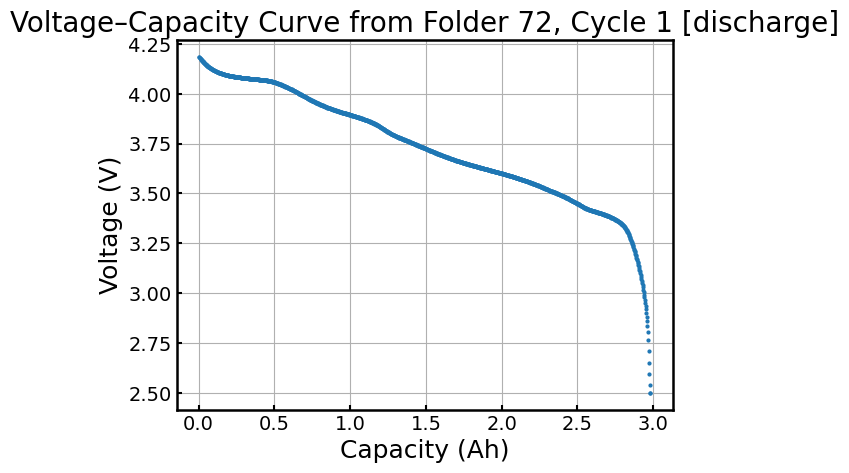

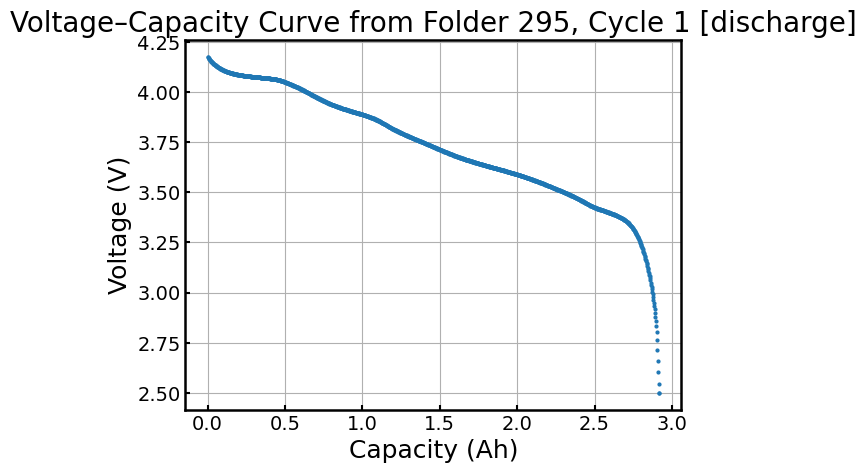

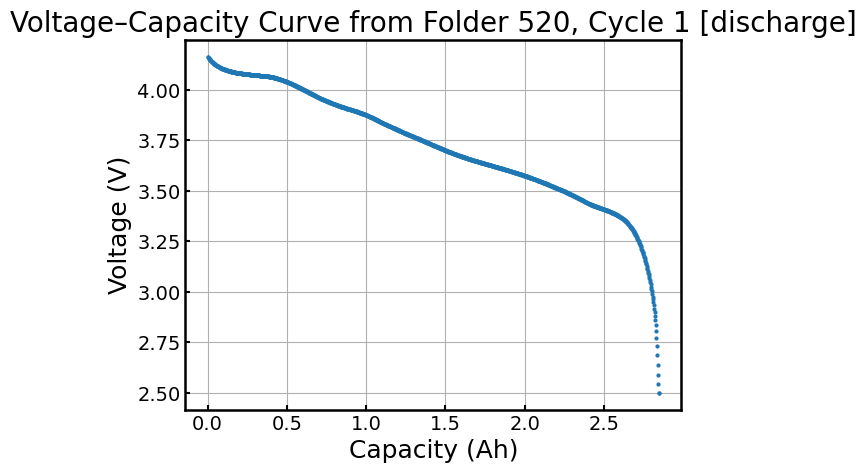

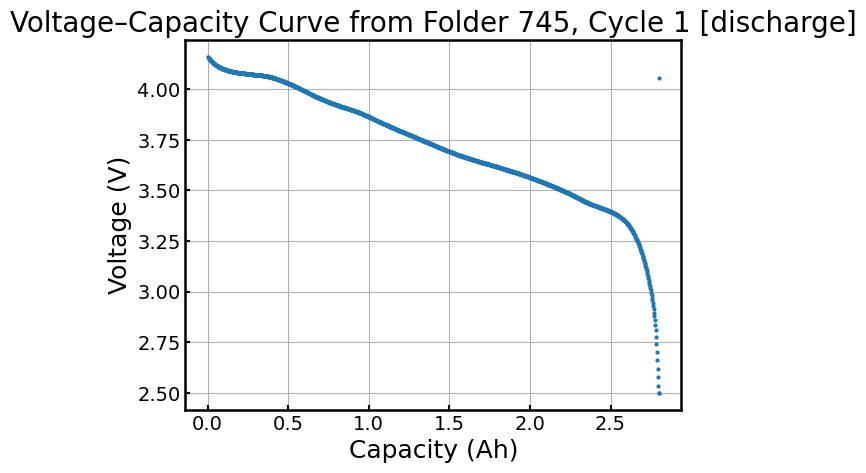

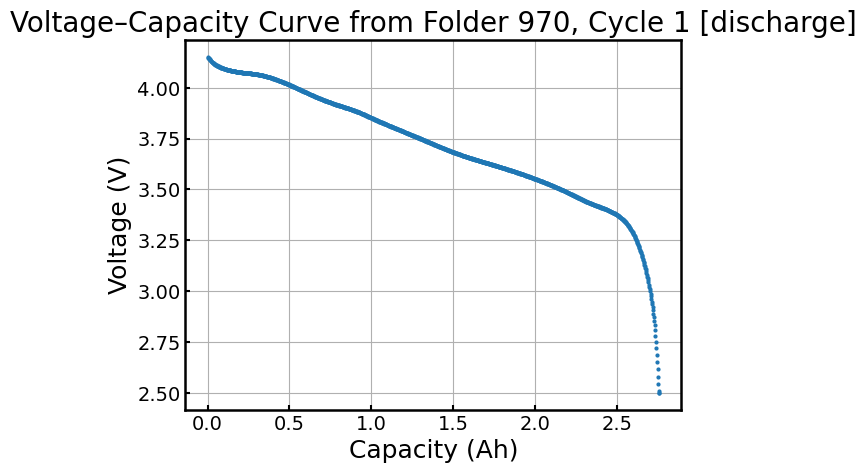

In [31]:
# Find the monotonic Q region
monotonic_q_range_process(
    folder_cycle_pairs=[(72, 1), (295, 1), (520, 1), (745, 1), (970, 1)],
    process='discharge',
    min_seg_length=50,
    min_v_variation=10,
    tol=0.0,
    min_points=3
)

plot_selected_qv(folder_cycle_pairs=[
    (72, 1), (295, 1), 
    (520, 1), (745, 1), (970, 1)],
    process='discharge',
    min_seg_length = 50,
    min_v_variation = 10,
    linestyle='none',
    marker='o',
    markersize=2)

In [32]:
save_from_qrange(
    inputs=[
    (72, 1, 0.41255, 2.9798),
    (295, 1, 0.40005, 2.915),
    (520, 1, 0.31986, 2.8463),
    (745, 1, 0.34739, 2.7991), 
    (970, 1, 0.26495, 2.7552)
],
    process='discharge',
    min_seg_length=50,
    min_v_variation=10)

[>>] Skipping folder 72, already cached.
[>>] Skipping folder 295, already cached.
[>>] Skipping folder 520, already cached.
[>>] Skipping folder 745, already cached.
[>>] Skipping folder 970, already cached.
[✓] Saved: Cycle 72_discharge.csv
[✓] Saved: Cycle 295_discharge.csv
[✓] Saved: Cycle 520_discharge.csv
[✓] Saved: Cycle 745_discharge.csv
[✓] Saved: Cycle 970_discharge.csv


In [33]:
save_from_qrange(
    inputs=[
    (72, 1, 0.021738, 2.5397),
    (295, 1, 0.03634, 2.4523),
    (520, 1, 0.0292, 2.4065),
    (745, 1, 0.03924, 2.2919), 
    (970, 1, 0.06462, 2.3443)
],
    process='charge',
    min_seg_length=50,
    min_v_variation=10)

'''batch_process_and_save(folder_cycle_pairs=[
    (72, 1), (295, 1), 
    (520, 1), (745, 1), 
    (970, 1)], 
    process='discharge', 
    min_seg_length = 50, min_v_variation = 10, 
    q_min = 2.3, q_max = 2.6,  
    window = 19, polyorder = 2
)'''

[>>] Skipping folder 72, already cached.
[>>] Skipping folder 295, already cached.
[>>] Skipping folder 520, already cached.
[>>] Skipping folder 745, already cached.
[>>] Skipping folder 970, already cached.
[✓] Saved: Cycle 72_charge.csv
[✓] Saved: Cycle 295_charge.csv
[✓] Saved: Cycle 520_charge.csv
[✓] Saved: Cycle 745_charge.csv
[✓] Saved: Cycle 970_charge.csv


"batch_process_and_save(folder_cycle_pairs=[\n    (72, 1), (295, 1), \n    (520, 1), (745, 1), \n    (970, 1)], \n    process='discharge', \n    min_seg_length = 50, min_v_variation = 10, \n    q_min = 2.3, q_max = 2.6,  \n    window = 19, polyorder = 2\n)"

In [34]:
save(process="charge",
                 step_pref_mV=4, min_step_mV=4,
                 min_pts_halfwidth=5, smooth_frac_ic=0.00, smooth_frac_dpde=0.01,
                 pos_tol=0.2, height_tol=0.2, width_tol=0.2)
save(process="discharge",
                 step_pref_mV=4, min_step_mV=2,
                 min_pts_halfwidth=5, smooth_frac_ic=0.00, smooth_frac_dpde=0.01,
                 pos_tol=0.2, height_tol=0.2, width_tol=0.2)

[ok] Cycle 295_charge -> Cycle 295_charge.csv  (ΔV≈4.00 mV, ΔE≈0.25 mWh)
[ok] Cycle 520_charge -> Cycle 520_charge.csv  (ΔV≈4.00 mV, ΔE≈0.25 mWh)
[ok] Cycle 72_charge -> Cycle 72_charge.csv  (ΔV≈4.00 mV, ΔE≈0.25 mWh)
[ok] Cycle 745_charge -> Cycle 745_charge.csv  (ΔV≈4.00 mV, ΔE≈0.25 mWh)
[ok] Cycle 970_charge -> Cycle 970_charge.csv  (ΔV≈4.00 mV, ΔE≈0.28 mWh)
[ok] Cycle 295_discharge -> Cycle 295_discharge.csv  (ΔV≈4.00 mV, ΔE≈0.25 mWh)
[ok] Cycle 520_discharge -> Cycle 520_discharge.csv  (ΔV≈4.00 mV, ΔE≈0.25 mWh)


D:\Anaconda\envs\FUSE_env\lib\site-packages\numpy\lib\function_base.py:1242: RuntimeWarning: divide by zero encountered in divide
  a = -(dx2)/(dx1 * (dx1 + dx2))
D:\Anaconda\envs\FUSE_env\lib\site-packages\numpy\lib\function_base.py:1243: RuntimeWarning: divide by zero encountered in divide
  b = (dx2 - dx1) / (dx1 * dx2)
D:\Anaconda\envs\FUSE_env\lib\site-packages\numpy\lib\function_base.py:1250: RuntimeWarning: invalid value encountered in add
  out[tuple(slice1)] = a * f[tuple(slice2)] + b * f[tuple(slice3)] + c * f[tuple(slice4)]
D:\Anaconda\envs\FUSE_env\lib\site-packages\numpy\lib\function_base.py:1281: RuntimeWarning: divide by zero encountered in scalar divide
  a = -(2. * dx1 + dx2)/(dx1 * (dx1 + dx2))
D:\Anaconda\envs\FUSE_env\lib\site-packages\numpy\lib\function_base.py:1282: RuntimeWarning: divide by zero encountered in scalar divide
  b = (dx1 + dx2) / (dx1 * dx2)
D:\Anaconda\envs\FUSE_env\lib\site-packages\numpy\lib\function_base.py:1285: RuntimeWarning: invalid value en

[ok] Cycle 72_discharge -> Cycle 72_discharge.csv  (ΔV≈4.00 mV, ΔE≈0.25 mWh)
[ok] Cycle 745_discharge -> Cycle 745_discharge.csv  (ΔV≈4.00 mV, ΔE≈0.25 mWh)
[ok] Cycle 970_discharge -> Cycle 970_discharge.csv  (ΔV≈4.00 mV, ΔE≈0.25 mWh)


In [35]:
lean_process(process = 'charge', no_interp = 4000, K=7, smoothing = 'w2')
lean_process(process = 'discharge', no_interp = 4000, K=7, smoothing = 'w2')

[Saved] Cycle 295_charge.csv (dV≈5.60 mV)
[Saved] Cycle 520_charge.csv (dV≈4.90 mV)
[Saved] Cycle 72_charge.csv (dV≈4.90 mV)
[Saved] Cycle 745_charge.csv (dV≈5.60 mV)
[Saved] Cycle 970_charge.csv (dV≈5.60 mV)
[Saved] Cycle 295_discharge.csv (dV≈4.90 mV)
[Saved] Cycle 520_discharge.csv (dV≈4.90 mV)
[Saved] Cycle 72_discharge.csv (dV≈5.60 mV)
[Saved] Cycle 745_discharge.csv (dV≈5.60 mV)
[Saved] Cycle 970_discharge.csv (dV≈5.60 mV)


[✓] Saved: lean_multidV.png


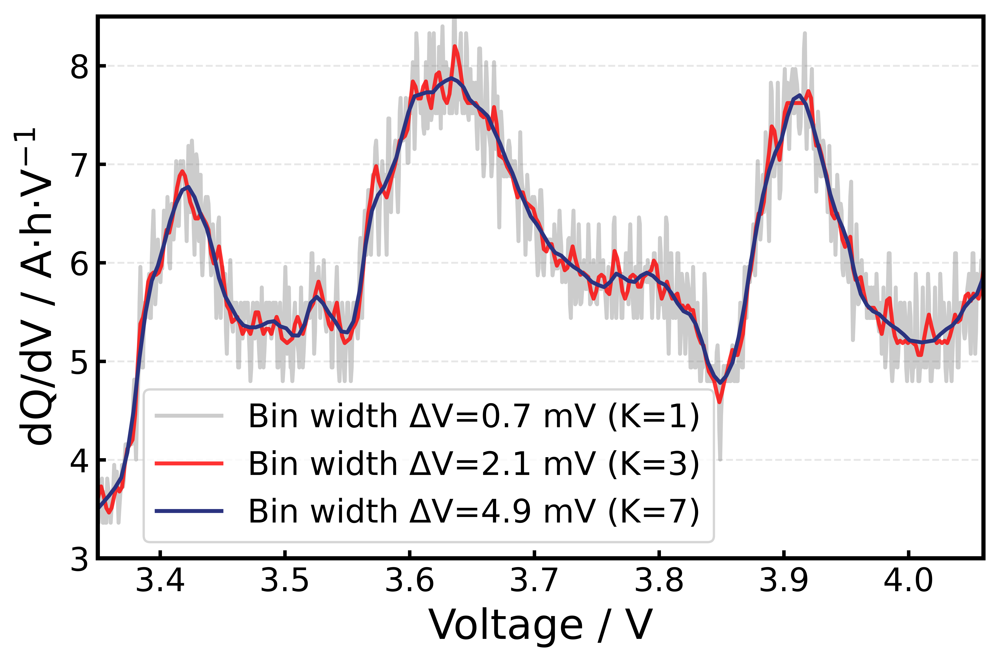

[✓] Saved: why_we_need_it.png


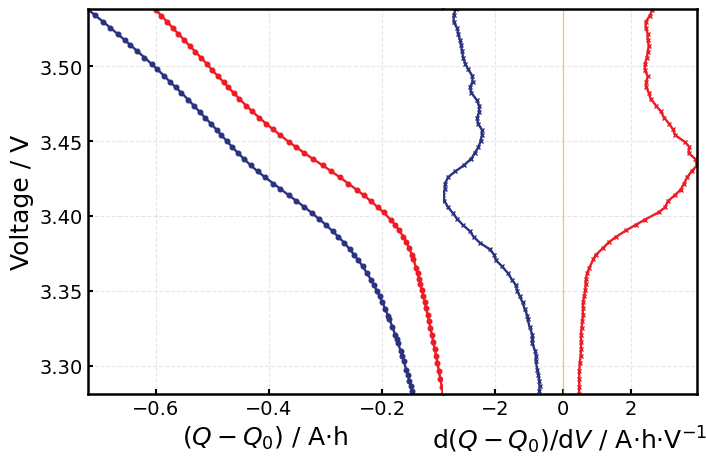

ValueError: '#3BA9C6 ' is not a valid value for color: supported inputs are (r, g, b) and (r, g, b, a) 0-1 float tuples; '#rrggbb', '#rrggbbaa', '#rgb', '#rgba' strings; named color strings; string reprs of 0-1 floats for grayscale values; 'C0', 'C1', ... strings for colors of the color cycle; and pairs combining one of the above with an alpha value

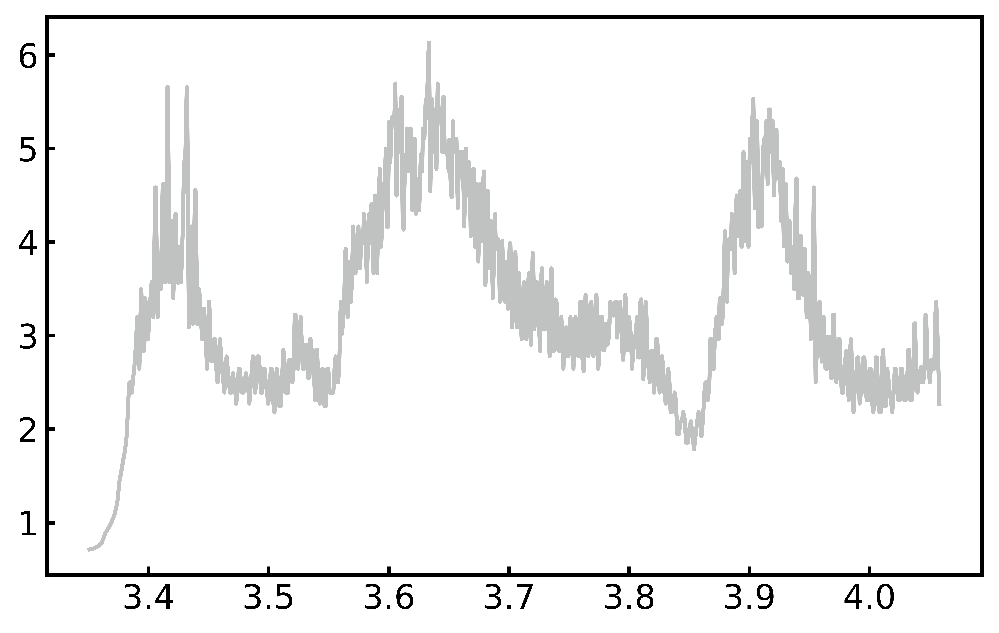

In [36]:
plt.close('all')

lean_dV_plot(
    process="charge", target_legend="Cycle 72", no_interp=4000,
    dV_list=(0.001, 0.002, 0.005),
    smoothing="w2",
    v_range=(3.35, 4.06),
    save_fig=True, 
    filename="lean_multidV.png",
    figsize=(6.1, 4.09)
)

fig, (axL, axR) = why_dqdv(
    "Cycle 520", v_range=(3.28, 3.54),
    q_unit="A·h", dqdv_unit="A·h·V$^{-1}$",
    save_fig=True, filename='why_we_need_it.png', 
    show_legend=False, ms=3.3, lw=1.7)
axL.set_ylim(3.3, 3.5)
axL.set_xlim(-0.6, -0.05)
axR.set_xlim(-4, 4)
# Note: red: charge, blue: discharge

In [38]:
plt.close('all')

[✓] Saved: dqdv_fixed_steps_cycle72.png


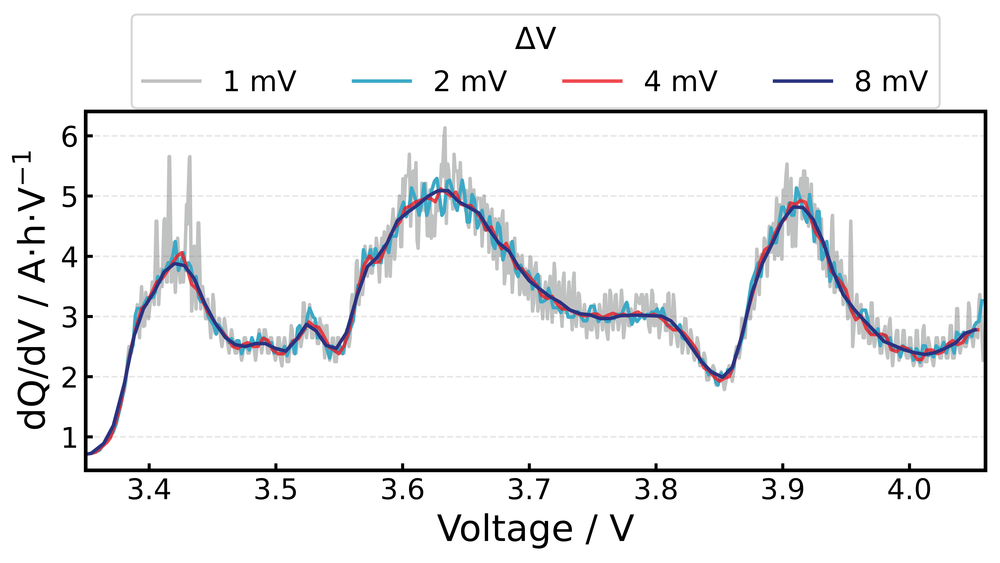

[✓] Saved: dqdv_savgol_levels.png


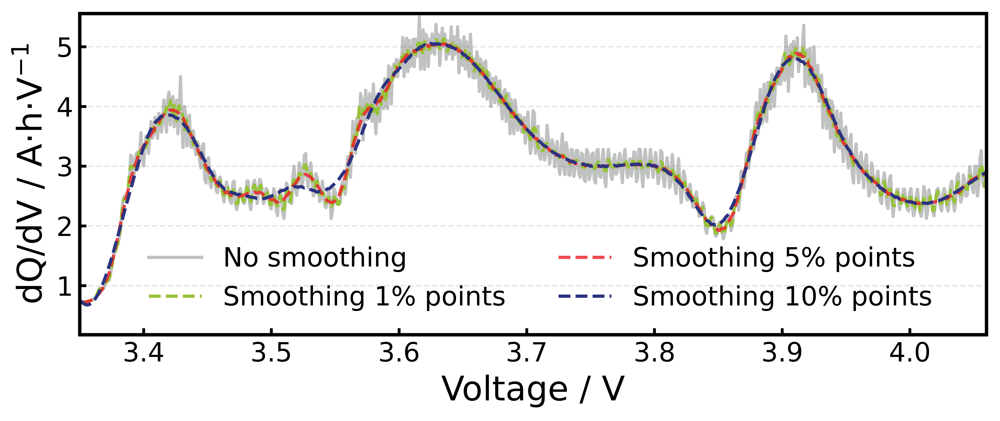

AttributeError: Line2D.set() got an unexpected keyword argument 'save_fig'

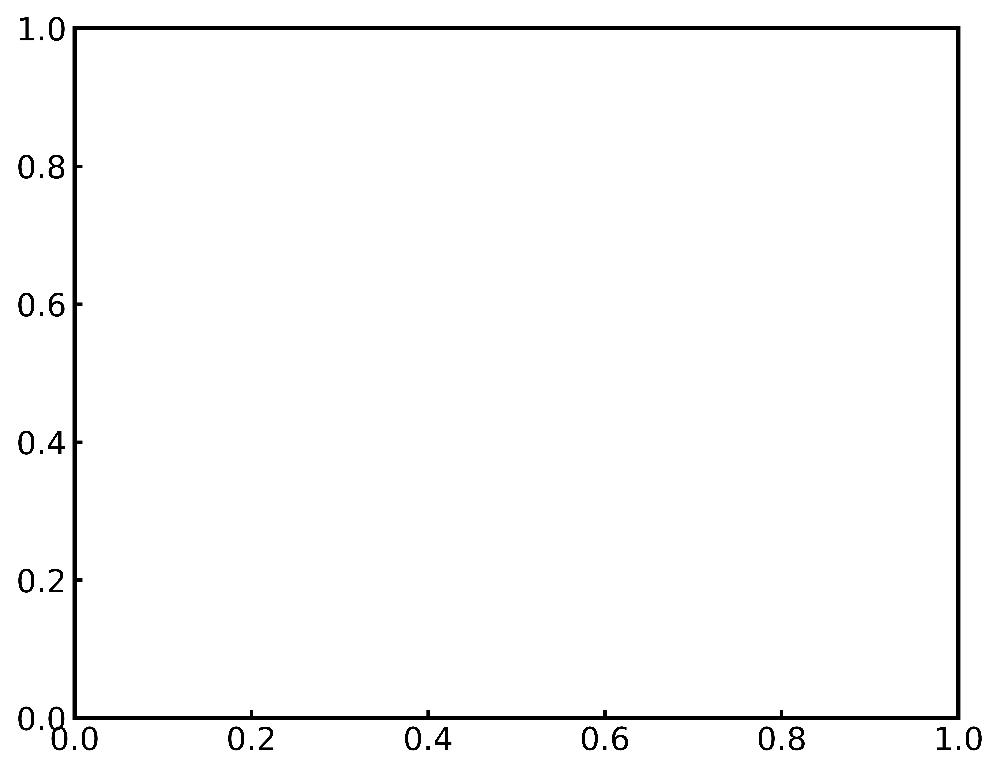

In [39]:
plot_dqdv_step_for_file(
    r"D:\FUSE 2025 SUM\battery-analysis-project\Data\monotonic_segments\Cycle 72_charge.csv",
    process="charge",
    steps_mV=(1, 2, 4, 8),
    v_range=(3.35, 4.06),
    smooth_frac_ic=0.0,
    save_fig=True,
    filename="dqdv_fixed_steps_cycle72.png",
    figsize=(7, 4.2), dpi=1200, lw=1.7)

[✓] Saved: dqdv_savgol_levels.png


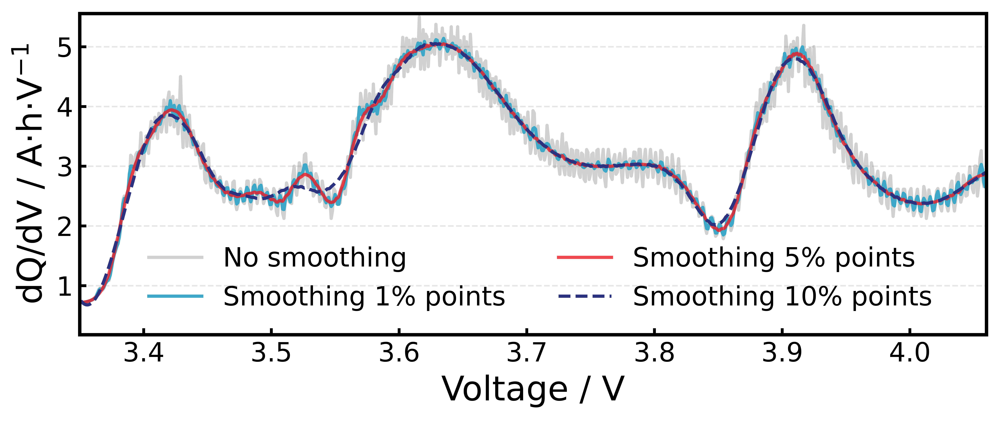

(<Figure size 9312x3840 with 1 Axes>,
 <Axes: xlabel='Voltage / V', ylabel='dQ/dV / A·h·V$^{-1}$'>)

In [51]:
plot_dqdv_smoothing_for_file(
    r"D:\FUSE 2025 SUM\battery-analysis-project\Data\monotonic_segments\Cycle 72_charge.csv",
    process="charge",
    levels=(0.01, 0.05, 0.10),
    v_range=(3.35, 4.06),
    step_mV=1.0,
    polyorder=3,
    colors={"raw": "#636466", 0.01:"#3BA9C6", 0.05:"#ED1C24", 0.10:"#2B3380"},
    save_fig=True,filename="dqdv_savgol_levels.png",
    figsize=(7.76, 3.2), dpi=1200, lw=1.7
)

[✓] Saved: method_compare.png


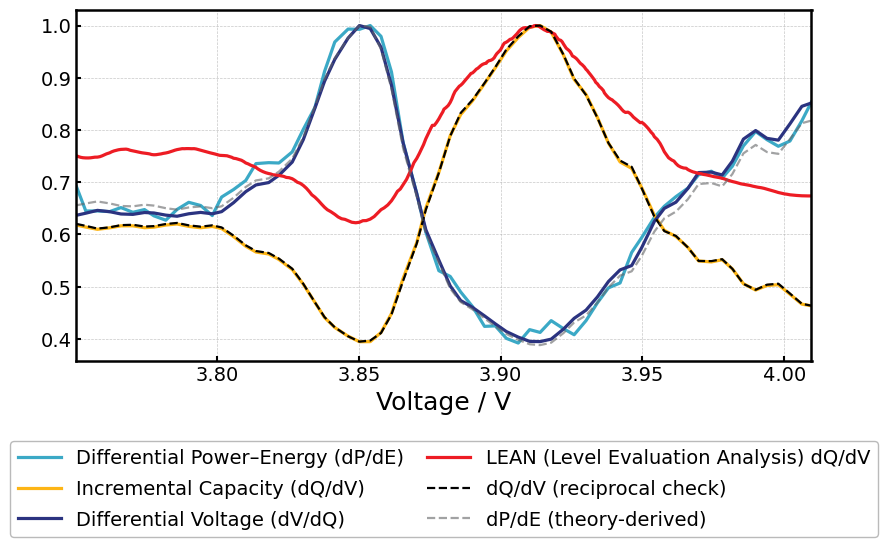

In [52]:
res = run_normalise_compare(process='charge', target_legend='Cycle 72',tol=0.0, vmin=3.75, vmax=4.01, lw_main=2.3, lw_theory=1.6,
                       sg_frac=0.045, sg_poly=3, save_fig=True, filename="method_compare.png")

In [59]:
plot_dqdv_sm(
    "charge",
    v_range=(3.75, 4.01),
    sg_frac=0.08,
    sg_poly=2,
    figsize=(7, 5.5), dpi=1200,
    save_fig=True,
    filename="dqdv_gradient_cycle.png",
    linestyle='-', lw=1.7
)

[✓] Saved: dqdv_gradient_cycle.png


(<Figure size 8400x6600 with 1 Axes>,
 <Axes: xlabel='Voltage / V', ylabel='dQ/dV / A·h·V$^{-1}$'>)